In [1]:
# Dependencies
import numpy as np
import re
import unidecode as ud
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

# Set matplotlib output format
%matplotlib inline

In [2]:
# Constants
PATH_CORPUS = 'data/war_and_peace_tolstoj.txt'  # Path to corpus
PATH_GLOVE = 'data/glove.6B.50d.txt'  # Path to glove vocabulary
RANDOM_SEED = 42  # Random seed

In [3]:
# Set random seed for reproducibility
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

In [4]:
# Get best available device
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
# Show selected device
print('Selected device: {:s}'.format(str(device)))

Selected device: cuda


In [5]:
# Load dataset
with open(PATH_CORPUS, 'r') as file:
    corpus = file.read()

In [6]:
# Subset corpus lines: start at line 
corpus

'BOOK ONE: 1805\n\n\n\n\n\nCHAPTER I\n\n“Well, Prince, so Genoa and Lucca are now just family estates of the\nBuonapartes. But I warn you, if you don’t tell me that this means war,\nif you still try to defend the infamies and horrors perpetrated by that\nAntichrist—I really believe he is Antichrist—I will have nothing\nmore to do with you and you are no longer my friend, no longer my\n‘faithful slave,’ as you call yourself! But how do you do? I see I\nhave frightened you—sit down and tell me all the news.”\n\nIt was in July, 1805, and the speaker was the well-known Anna Pávlovna\nSchérer, maid of honor and favorite of the Empress Márya Fëdorovna.\nWith these words she greeted Prince Vasíli Kurágin, a man of high\nrank and importance, who was the first to arrive at her reception. Anna\nPávlovna had had a cough for some days. She was, as she said, suffering\nfrom la grippe; grippe being then a new word in St. Petersburg, used\nonly by the elite.\n\nAll her invitations without exception, 

In [7]:
# Define a function for splitting text into paragraphs (separated by double newlines)
def split_paragraphs(text):
    """
    Split text into paragraphs:
    strings which terminates with double (or more) newlines [\n\n]
    """
    paragraphs = re.split(r'[\n][\n]+', text)
    return paragraphs

In [8]:
# Define a function for splitting text into sentences
def split_sentences(text):
    """
    Sentences are strings which can terminate:
    - with punctuation [.!?]
    - followed by closing quotes ['"]
    - followed by space or newline [ \n]
    Note that termination characters must be kept
    """
    sentences = re.findall(r'([^\.\!\?\:\;]*[\.\!\?\:\;]+[\'\"]?[ \n]*)', text)
    return sentences

In [9]:
# Define a function for splitting text into words
def split_words(text):
    words = re.findall(r'([^\w]|[\w]+)', text)
    return words

In [10]:
# Define a function for cleaning text
def clean_text(text):
    """
    Text must be cleaned, in order to remove:
    - accents
    - repeated special characters [\s\n]
    - uppercase characters
    """
    text = text.lower()  # Lowercase
    text = ud.unidecode(text)  # Remove accents
    text = re.sub(r'[ ]+', ' ', text)  # Remove multiple whitespaces
    text = re.sub(r'[\n][\n]+', '\n\n', text)  # Remove multiple newlines (more than two)
    return text

In [11]:
# Clean text
corpus = clean_text(corpus)
corpus

'book one: 1805\n\nchapter i\n\n"well, prince, so genoa and lucca are now just family estates of the\nbuonapartes. but i warn you, if you don\'t tell me that this means war,\nif you still try to defend the infamies and horrors perpetrated by that\nantichrist--i really believe he is antichrist--i will have nothing\nmore to do with you and you are no longer my friend, no longer my\n\'faithful slave,\' as you call yourself! but how do you do? i see i\nhave frightened you--sit down and tell me all the news."\n\nit was in july, 1805, and the speaker was the well-known anna pavlovna\nscherer, maid of honor and favorite of the empress marya fedorovna.\nwith these words she greeted prince vasili kuragin, a man of high\nrank and importance, who was the first to arrive at her reception. anna\npavlovna had had a cough for some days. she was, as she said, suffering\nfrom la grippe; grippe being then a new word in st. petersburg, used\nonly by the elite.\n\nall her invitations without exception, wr

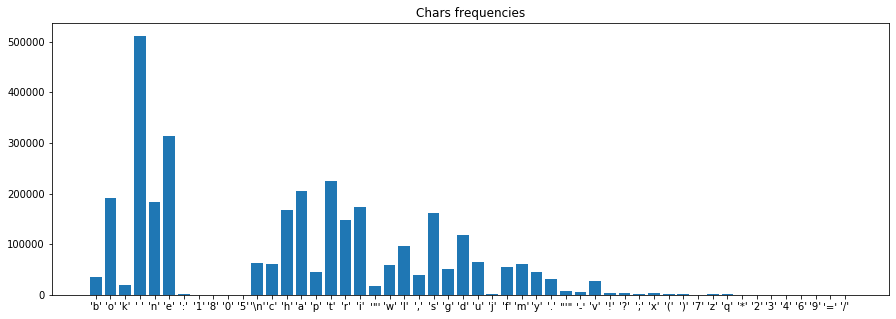

In [12]:
# Show characters frequencies

# Initialize characters counter
char_count = {}
# Fill the dictionary with counts
for c in corpus:
    char_count[c] = char_count.get(c, 0) + 1
# Get chars and counts
x_char = [repr(c) for c in char_count.keys()]
y_count = [*char_count.values()]
    
# Plot chars
fig, ax = plt.subplots(figsize=(15, 5))
_ = ax.set_title('Chars frequencies')
_ = ax.bar(x_char, y_count)
_ = plt.show()

In [13]:
# Split text into paragraphs
paragraphs = split_paragraphs(corpus)
paragraphs

['book one: 1805',
 'chapter i',
 '"well, prince, so genoa and lucca are now just family estates of the\nbuonapartes. but i warn you, if you don\'t tell me that this means war,\nif you still try to defend the infamies and horrors perpetrated by that\nantichrist--i really believe he is antichrist--i will have nothing\nmore to do with you and you are no longer my friend, no longer my\n\'faithful slave,\' as you call yourself! but how do you do? i see i\nhave frightened you--sit down and tell me all the news."',
 'it was in july, 1805, and the speaker was the well-known anna pavlovna\nscherer, maid of honor and favorite of the empress marya fedorovna.\nwith these words she greeted prince vasili kuragin, a man of high\nrank and importance, who was the first to arrive at her reception. anna\npavlovna had had a cough for some days. she was, as she said, suffering\nfrom la grippe; grippe being then a new word in st. petersburg, used\nonly by the elite.',
 'all her invitations without exceptio

In [14]:
# Remove books and chapters
paragraphs = [p for p in paragraphs if not re.match(r'book [a-z]+: [0-9]{4}', p)]
paragraphs = [p for p in paragraphs if not re.match(r'chapter [a-z]+', p)]
paragraphs

['"well, prince, so genoa and lucca are now just family estates of the\nbuonapartes. but i warn you, if you don\'t tell me that this means war,\nif you still try to defend the infamies and horrors perpetrated by that\nantichrist--i really believe he is antichrist--i will have nothing\nmore to do with you and you are no longer my friend, no longer my\n\'faithful slave,\' as you call yourself! but how do you do? i see i\nhave frightened you--sit down and tell me all the news."',
 'it was in july, 1805, and the speaker was the well-known anna pavlovna\nscherer, maid of honor and favorite of the empress marya fedorovna.\nwith these words she greeted prince vasili kuragin, a man of high\nrank and importance, who was the first to arrive at her reception. anna\npavlovna had had a cough for some days. she was, as she said, suffering\nfrom la grippe; grippe being then a new word in st. petersburg, used\nonly by the elite.',
 'all her invitations without exception, written in french, and deliver

In [15]:
# Get paragraphs insights
len_paragraphs = [len(p) for p in paragraphs] 

print('There are {:d} paragraphs in text, with maximum length {:d} (chars) and minimum length {:d} (chars)'.format(
    len(len_paragraphs),
    max(len_paragraphs),
    min(len_paragraphs)
))

There are 11343 paragraphs in text, with maximum length 4387 (chars) and minimum length 4 (chars)


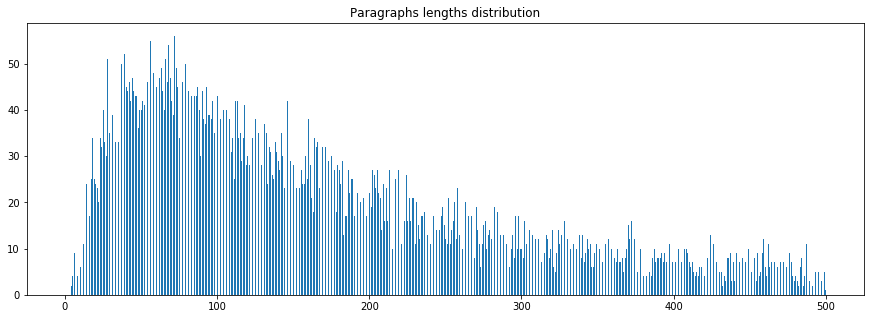

In [16]:
# Plot paragraphs lengths distribution
fig, ax = plt.subplots(figsize=(15, 5))
_ = ax.set_title('Paragraphs lengths distribution')
_ = ax.hist(len_paragraphs, bins=1000, range=(0, 500))
_ = plt.show()

In [17]:
# Split each paragraph in sentences
sentences = list()
# For each paragraph, retireve contained sentences
for p in paragraphs:
    sentences += split_sentences(p)
# Show retrieved sentences
sentences

['"well, prince, so genoa and lucca are now just family estates of the\nbuonapartes. ',
 "but i warn you, if you don't tell me that this means war,\nif you still try to defend the infamies and horrors perpetrated by that\nantichrist--i really believe he is antichrist--i will have nothing\nmore to do with you and you are no longer my friend, no longer my\n'faithful slave,' as you call yourself! ",
 'but how do you do? ',
 'i see i\nhave frightened you--sit down and tell me all the news."',
 'it was in july, 1805, and the speaker was the well-known anna pavlovna\nscherer, maid of honor and favorite of the empress marya fedorovna.\n',
 'with these words she greeted prince vasili kuragin, a man of high\nrank and importance, who was the first to arrive at her reception. ',
 'anna\npavlovna had had a cough for some days. ',
 'she was, as she said, suffering\nfrom la grippe; ',
 'grippe being then a new word in st. ',
 'petersburg, used\nonly by the elite.',
 'all her invitations without exce

In [18]:
# Split each sentence into words
for i, sentence in enumerate(sentences):
    sentences[i] = split_words(sentence)
# Show tokenized sentences
sentences

[['"',
  'well',
  ',',
  ' ',
  'prince',
  ',',
  ' ',
  'so',
  ' ',
  'genoa',
  ' ',
  'and',
  ' ',
  'lucca',
  ' ',
  'are',
  ' ',
  'now',
  ' ',
  'just',
  ' ',
  'family',
  ' ',
  'estates',
  ' ',
  'of',
  ' ',
  'the',
  '\n',
  'buonapartes',
  '.',
  ' '],
 ['but',
  ' ',
  'i',
  ' ',
  'warn',
  ' ',
  'you',
  ',',
  ' ',
  'if',
  ' ',
  'you',
  ' ',
  'don',
  "'",
  't',
  ' ',
  'tell',
  ' ',
  'me',
  ' ',
  'that',
  ' ',
  'this',
  ' ',
  'means',
  ' ',
  'war',
  ',',
  '\n',
  'if',
  ' ',
  'you',
  ' ',
  'still',
  ' ',
  'try',
  ' ',
  'to',
  ' ',
  'defend',
  ' ',
  'the',
  ' ',
  'infamies',
  ' ',
  'and',
  ' ',
  'horrors',
  ' ',
  'perpetrated',
  ' ',
  'by',
  ' ',
  'that',
  '\n',
  'antichrist',
  '-',
  '-',
  'i',
  ' ',
  'really',
  ' ',
  'believe',
  ' ',
  'he',
  ' ',
  'is',
  ' ',
  'antichrist',
  '-',
  '-',
  'i',
  ' ',
  'will',
  ' ',
  'have',
  ' ',
  'nothing',
  '\n',
  'more',
  ' ',
  'to',
  ' ',
  'do',
  ' 

In [19]:
# Get sentences insights
len_sentences = [len(s) for s in sentences] 

print('There are {:d} sentences in text, with maximum length {:d} (chars) and minimum length {:d} (chars)'.format(
    len(len_sentences),
    max(len_sentences),
    min(len_sentences)
))

There are 35514 sentences in text, with maximum length 361 (chars) and minimum length 2 (chars)


In [20]:
sentences[2830:2840]

[['read',
  ' ',
  'the',
  '\n',
  'mystical',
  ' ',
  'book',
  ' ',
  'i',
  ' ',
  'am',
  ' ',
  'sending',
  ' ',
  'you',
  ';',
  ' '],
 ['it',
  ' ',
  'has',
  ' ',
  'an',
  ' ',
  'enormous',
  ' ',
  'success',
  ' ',
  'here',
  '.',
  ' '],
 ['though',
  '\n',
  'there',
  ' ',
  'are',
  ' ',
  'things',
  ' ',
  'in',
  ' ',
  'it',
  ' ',
  'difficult',
  ' ',
  'for',
  ' ',
  'the',
  ' ',
  'feeble',
  ' ',
  'human',
  ' ',
  'mind',
  ' ',
  'to',
  ' ',
  'grasp',
  ',',
  ' ',
  'it',
  '\n',
  'is',
  ' ',
  'an',
  ' ',
  'admirable',
  ' ',
  'book',
  ' ',
  'which',
  ' ',
  'calms',
  ' ',
  'and',
  ' ',
  'elevates',
  ' ',
  'the',
  ' ',
  'soul',
  '.',
  ' '],
 ['adieu', '!', ' '],
 ['give',
  '\n',
  'my',
  ' ',
  'respects',
  ' ',
  'to',
  ' ',
  'monsieur',
  ' ',
  'your',
  ' ',
  'father',
  ' ',
  'and',
  ' ',
  'my',
  ' ',
  'compliments',
  ' ',
  'to',
  ' ',
  'mademoiselle',
  '\n',
  'bourienne',
  '.',
  ' '],
 ['i',
  ' ',
  'em

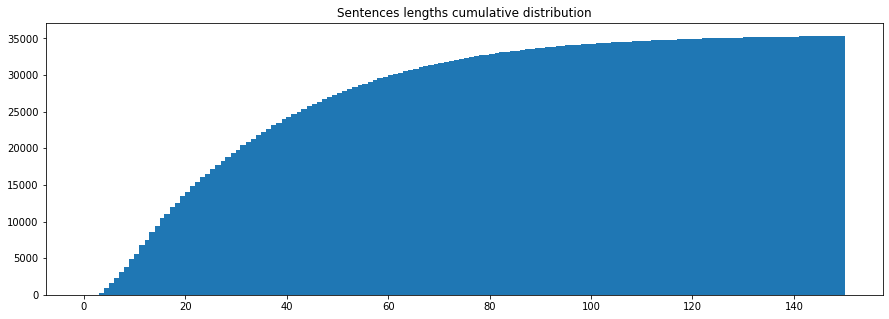

In [21]:
# Plot sentences lengths distribution
fig, ax = plt.subplots(figsize=(15, 5))
_ = ax.set_title('Sentences lengths cumulative distribution')
_ = ax.hist(len_sentences, cumulative=True, bins=1000, range=(0, 150))
_ = plt.show()

In [22]:
# Load embedding vocabulary
vocabulary = dict()
with open(PATH_GLOVE, 'r') as file:
    for line in file:
        # Split each line in file
        line = line.split(' ')
        # Retrieve word and its correspondent vector
        word, vector = line[0], line[1:]
        # Save word and vector in new vocabulary
        vocabulary[word] = np.array(vector, dtype=np.float)
        
# Show vocabulary
vocabulary

{'the': array([ 4.1800e-01,  2.4968e-01, -4.1242e-01,  1.2170e-01,  3.4527e-01,
        -4.4457e-02, -4.9688e-01, -1.7862e-01, -6.6023e-04, -6.5660e-01,
         2.7843e-01, -1.4767e-01, -5.5677e-01,  1.4658e-01, -9.5095e-03,
         1.1658e-02,  1.0204e-01, -1.2792e-01, -8.4430e-01, -1.2181e-01,
        -1.6801e-02, -3.3279e-01, -1.5520e-01, -2.3131e-01, -1.9181e-01,
        -1.8823e+00, -7.6746e-01,  9.9051e-02, -4.2125e-01, -1.9526e-01,
         4.0071e+00, -1.8594e-01, -5.2287e-01, -3.1681e-01,  5.9213e-04,
         7.4449e-03,  1.7778e-01, -1.5897e-01,  1.2041e-02, -5.4223e-02,
        -2.9871e-01, -1.5749e-01, -3.4758e-01, -4.5637e-02, -4.4251e-01,
         1.8785e-01,  2.7849e-03, -1.8411e-01, -1.1514e-01, -7.8581e-01]),
 ',': array([ 0.013441,  0.23682 , -0.16899 ,  0.40951 ,  0.63812 ,  0.47709 ,
        -0.42852 , -0.55641 , -0.364   , -0.23938 ,  0.13001 , -0.063734,
        -0.39575 , -0.48162 ,  0.23291 ,  0.090201, -0.13324 ,  0.078639,
        -0.41634 , -0.15428 ,  0.1

In [23]:
# Check how many words are encoded in glove vocabulary
words_text = set(w for s in sentences for w in s) # Retrieve all words in text
words_vocab = set(w for w in vocabulary.keys()) # Retrieve all words in vocabulary

print('There are {:d} different words in text and {:d} different words in vocabulary, of which {:d} are in common'.format(
    len(words_text),
    len(words_vocab),
    len(words_text & words_vocab)
))

There are 17502 different words in text and 400000 different words in vocabulary, of which 16185 are in common


In [24]:
# Discard all vectors associated to words which are not in text
vocabulary = {w: vocabulary[w] for w in (words_text & words_vocab)}
vocabulary

{'water': array([ 0.53507 ,  0.5761  , -0.054351, -0.208   , -0.7882  , -0.17592 ,
        -0.21255 , -0.14388 ,  1.0344  , -0.079253,  0.27696 ,  0.37951 ,
         1.2139  , -0.34032 , -0.18118 ,  0.72968 ,  0.89373 ,  0.82912 ,
        -0.88932 , -1.4071  ,  0.55571 , -0.017453,  1.2524  , -0.57916 ,
         0.43    , -0.77935 ,  0.4977  ,  1.2746  ,  1.0448  ,  0.36433 ,
         3.7921  ,  0.083653, -0.45044 , -0.063996, -0.19866 ,  0.75252 ,
        -0.27811 ,  0.42783 ,  1.4755  ,  0.37735 ,  0.079519,  0.024462,
         0.5013  ,  0.33565 ,  0.051406,  0.39879 , -0.35603 , -0.78654 ,
         0.61563 , -0.95478 ]),
 'censers': array([-0.4903  , -0.97833 , -0.12638 , -0.23958 , -0.29387 ,  0.53083 ,
         0.42118 ,  0.28724 , -0.46518 ,  0.96716 , -0.32646 , -0.56766 ,
         0.37063 ,  0.91613 , -0.78759 , -0.67922 , -0.43093 , -0.17624 ,
         0.26598 , -0.64506 ,  0.24716 , -0.16432 , -0.017467, -0.16981 ,
         0.12353 ,  0.77893 ,  1.3323  ,  0.23076 ,  0.20394

In [25]:
# Retrieve the matrix of vector embeddings
vectors = np.array([*vocabulary.values()], dtype=np.float)
vectors.shape

(16185, 50)

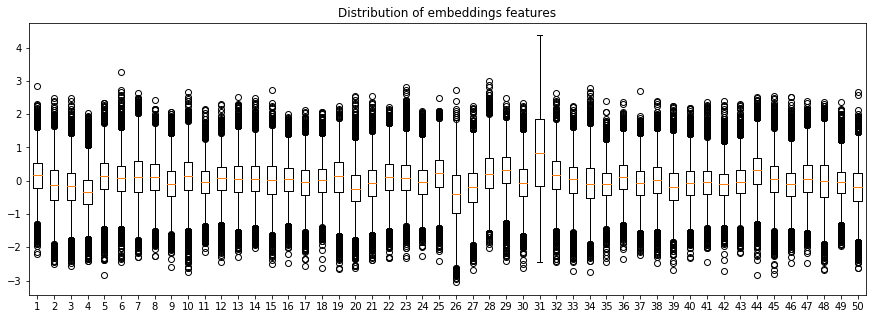

In [26]:
# Show distribution of each feature in glove vocabulary
fig, ax = plt.subplots(figsize=(15, 5))
_ = ax.set_title('Distribution of embeddings features')
_ = ax.boxplot(vectors)
_ = plt.show()

In [27]:
# For words not in vocabulary yet: make a random sampling accroding to current features distribution

# Get sampling statistics
sample_mean = np.apply_along_axis(np.mean, 0, vectors)
sample_std = np.apply_along_axis(np.std, 0, vectors)

# Execute sampling for words not already embedded
for word in (words_text - words_vocab):
    # Add entry to vocabulary
    vocabulary.setdefault(word, np.random.normal(sample_mean, sample_std))
# Show vocabulary
words = list(vocabulary.keys())
print('Index of blank space word " " is {:d}'.format(words.index(' ')))

Index of blank space word " " is 17010


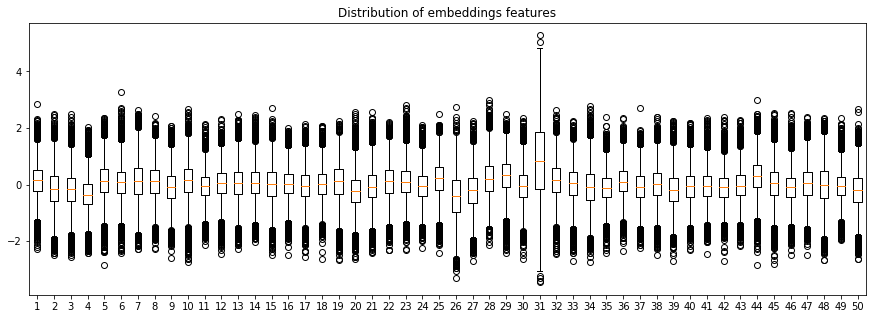

In [28]:
# Show distribution of each feature in vocabulary, after sampling
vectors = np.array([*vocabulary.values()], dtype=np.float)

fig, ax = plt.subplots(figsize=(15, 5))
_ = ax.set_title('Distribution of embeddings features')
_ = ax.boxplot(vectors)
_ = plt.show()

In [29]:
# Define a Dataset class for automatically load corpus
class MyDataset(Dataset):
    
    # Constructor
    def __init__(self, sentences, vocabulary, crop_len=5):
        
        # Store crop length
        self.crop_len = crop_len
        
        # Store embedding vectors matrix
        self.vectors = np.array([*vocabulary.values()], dtype=np.float)
        
        # Define word to index and index to word dictionaries
        self.w2i, self.i2w = dict(), dict()
        # Fill dictionaries
        for i, word in enumerate(vocabulary.keys()):
            self.w2i.setdefault(word, i)
            self.i2w.setdefault(i, word)
            
        # Store sentences as list of word indices
        self.sentences = [[self.w2i[w] for w in s] for s in sentences]
        # Remove sentences with length greater than crop length
        self.sentences = [s for s in self.sentences if not len(s) < self.crop_len]
        
    # Define len( ) friend function
    def __len__(self):
        return len(self.sentences)
    
    # Define squared brackets [] operator
    def __getitem__(self, i):
        # Get i-th sentence
        sentence = self.sentences[i]
        # Check that crop and sentence length are not equal: return the whole sentence oth
        if self.crop_len < len(sentence):
            i = np.random.randint(0, len(sentence) - self.crop_len)  # Start index
            j = i + self.crop_len  # End index
            sentence = sentence[i:j]
        # Return randomly cropped sentence
        return torch.tensor(sentence, dtype=torch.long)

In [30]:
# Test dataset class
ds = MyDataset(sentences, vocabulary, crop_len=10)

# Blank space ' ' should be in position 17467
print('Blank space " " is in position {:d}'.format(ds.w2i[' ']))

Blank space " " is in position 17010


In [31]:
# Print first sentence, either encoded and decoded
# Note: it is random cropped
encoded = ds[0]
decoded = [ds.i2w[i.item()] for i in encoded]
print('Sentence length: {:d}'.format(len(encoded)), end='\n\n')
print('Encoded sentence:\n{:s}'.format(str(encoded)), end='\n\n')
print('Decoded sentence:\n{:s}'.format(str(decoded)))

Sentence length: 10

Encoded sentence:
tensor([ 7372, 17010,  8400, 17010,  2796, 17010, 12265, 17010,  3670, 17416])

Decoded sentence:
['just', ' ', 'family', ' ', 'estates', ' ', 'of', ' ', 'the', '\n']


In [32]:
# Define new Neural Network for learning writing from corpus
class MyNeuralNetwork(nn.Module):
    
    # Constructor
    def __init__(self, num_embeddings, embedding_dim, hidden_size, num_layers, hidden_type=nn.LSTM, 
                 dropout=0, max_norm=None, norm_type=2, scale_grad_by_freq=False):
        
        # Initialize parent class (nn.Module)
        super().__init__()
        
        # Add input layer (embedding)
        self.emb = nn.Embedding(num_embeddings, embedding_dim)
        
        # Add recurrent hidden layer(s)
        self.rnn = hidden_type(
            input_size = embedding_dim,
            hidden_size = hidden_size,
            num_layers = num_layers,
            dropout = dropout,
            batch_first = True
        )
        
        # Add output Linear layer
        self.out = nn.Linear(hidden_size, num_embeddings)
        
    # Define forward step
    def forward(self, x, state=None):
        # Process input through embedding layer
        x = self.emb(x)
        # Pass input to hidden layer
        x, state = self.rnn(x, state)
        # Compute output value through Linear layer
        return self.out(x), state

In [33]:
# Define function for training batches
def train_batch(net, batch, loss_fn, optimizer):
    
    # Get desired output from batch
    y_true = batch[:, -1]
    # Get network input
    x_true = batch[:, :-1]
    
    # Clean gradient
    optimizer.zero_grad()
    
    # Compute forward pass
    x_pred, _ = net(x_true)
    
    # Compute loss
    loss = loss_fn(x_pred[:, -1], y_true)  # Evaluate loss function
    loss.backward()  # Make backward pass
    optimizer.step()  # Make optimizer step
    
    # Return computed loss
    return float(loss.data)

In [34]:
# Define function for training
def train(net, dataset, num_epochs, batch_size, loss_fn, optimizer, shuffle=True, verbose=False,
         device=torch.device('cpu')):
    
    # Pass Dataset object to DataLoader initialization
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=shuffle)
    
    # Loop through each epoch
    for epoch in range(num_epochs):
        # Verbose log
        if verbose: print('Epoch nr.{:d}'.format(epoch + 1))
        # Loop through every batch
        for i, batch in enumerate(dataloader):
            # Move batch on device
            batch = batch.to(device)
            # Train current batch
            loss = train_batch(net, batch, loss_fn=loss_fn, optimizer=optimizer)
            # Remove batch from memory
            del batch
            # Verbose los
            if verbose: print('  Batch nr.{:d} with loss {:.05f}'.format(i + 1, loss))
        # Verbose log
        if verbose: print()  # Skip one row

In [76]:
# Define a function for testing
def test(net, dataset, text_seed, num_words):
    # Show current text seed
    print(text_seed, end='', flush=True)
    # Encode text seed, keep only those already known
    text_encoded = [dataset.w2i[w] for w in split_words(text_seed) if w in set(dataset.w2i.keys())]
    text_encoded = torch.tensor(text_encoded, dtype=torch.long).unsqueeze(0)
    # Initialize network state
    net_state = None
    # Set the neural network into evaluation mode
    net.eval()
    # Disable gradient tracking
    with torch.no_grad():
        # Generate the given number of words
        for i in range(num_words):
            # Predict new word using softmax multinomial probabilities
            net_out, net_state = net(text_encoded, net_state)  # Network output
            index_pred = nn.functional.softmax(net_out[:, -1], dim=1).multinomial(1).item()  # New word index
            word_pred = dataset.i2w[index_pred]  # New word string
            # Get new encoded text seed
            text_encoded = torch.tensor([[index_pred]], dtype=torch.long)
            # Print out new word
            print(word_pred, end='', flush=True)

In [35]:
# Define new neural network
net = MyNeuralNetwork(
    num_embeddings = ds.vectors.shape[0],
    embedding_dim = ds.vectors.shape[1],
    hidden_size = 512,
    num_layers = 2,
    dropout = 0.5
)

# Initialize embeddings weights (set embeddings trainable)
net.emb.from_pretrained(
    torch.from_numpy(ds.vectors), 
    freeze=False
)

# Move neural network on GPU
net.to(device)

MyNeuralNetwork(
  (emb): Embedding(17502, 50)
  (rnn): LSTM(50, 512, num_layers=2, batch_first=True, dropout=0.5)
  (out): Linear(in_features=512, out_features=17502, bias=True)
)

In [37]:
# Train the previously initialized neural network
train(net, ds, num_epochs=100, batch_size=100, loss_fn=nn.CrossEntropyLoss(),
     optimizer=optim.Adam(net.parameters(), weight_decay=5e-4), device=device,
     verbose=True)

Epoch nr.1
  Batch nr.1 with loss 3.91244
  Batch nr.2 with loss 4.17381
  Batch nr.3 with loss 3.93374
  Batch nr.4 with loss 3.92204
  Batch nr.5 with loss 3.72512
  Batch nr.6 with loss 3.84882
  Batch nr.7 with loss 3.89695
  Batch nr.8 with loss 4.11298
  Batch nr.9 with loss 4.21935
  Batch nr.10 with loss 3.62274
  Batch nr.11 with loss 4.63528
  Batch nr.12 with loss 3.52784
  Batch nr.13 with loss 3.74048
  Batch nr.14 with loss 4.19986
  Batch nr.15 with loss 3.83460
  Batch nr.16 with loss 4.27358
  Batch nr.17 with loss 3.54484
  Batch nr.18 with loss 4.11564
  Batch nr.19 with loss 3.64430
  Batch nr.20 with loss 3.53588
  Batch nr.21 with loss 4.40658
  Batch nr.22 with loss 4.06072
  Batch nr.23 with loss 3.87361
  Batch nr.24 with loss 3.56400
  Batch nr.25 with loss 4.44301
  Batch nr.26 with loss 4.23599
  Batch nr.27 with loss 3.89281
  Batch nr.28 with loss 4.48932
  Batch nr.29 with loss 4.48789
  Batch nr.30 with loss 4.32376
  Batch nr.31 with loss 4.13177
  Batc

  Batch nr.255 with loss 3.84463
  Batch nr.256 with loss 3.35281
  Batch nr.257 with loss 3.88962
  Batch nr.258 with loss 3.31290
  Batch nr.259 with loss 3.97708
  Batch nr.260 with loss 4.11405
  Batch nr.261 with loss 3.66443
  Batch nr.262 with loss 3.95067
  Batch nr.263 with loss 3.25924
  Batch nr.264 with loss 3.62550
  Batch nr.265 with loss 4.00546
  Batch nr.266 with loss 3.49542
  Batch nr.267 with loss 4.33297
  Batch nr.268 with loss 3.72402
  Batch nr.269 with loss 3.61984
  Batch nr.270 with loss 3.87476
  Batch nr.271 with loss 3.30702
  Batch nr.272 with loss 3.31953
  Batch nr.273 with loss 4.31119
  Batch nr.274 with loss 3.58168
  Batch nr.275 with loss 3.28494
  Batch nr.276 with loss 4.08728
  Batch nr.277 with loss 3.42127
  Batch nr.278 with loss 4.45758
  Batch nr.279 with loss 3.71516
  Batch nr.280 with loss 3.30050
  Batch nr.281 with loss 3.82637
  Batch nr.282 with loss 3.00342
  Batch nr.283 with loss 3.82716
  Batch nr.284 with loss 3.50537
  Batch nr

  Batch nr.200 with loss 3.15273
  Batch nr.201 with loss 3.27538
  Batch nr.202 with loss 3.71338
  Batch nr.203 with loss 3.42375
  Batch nr.204 with loss 3.22135
  Batch nr.205 with loss 3.07950
  Batch nr.206 with loss 4.03856
  Batch nr.207 with loss 3.58249
  Batch nr.208 with loss 4.18078
  Batch nr.209 with loss 4.29519
  Batch nr.210 with loss 3.82020
  Batch nr.211 with loss 3.78258
  Batch nr.212 with loss 4.35321
  Batch nr.213 with loss 3.84503
  Batch nr.214 with loss 3.58479
  Batch nr.215 with loss 3.53797
  Batch nr.216 with loss 3.58364
  Batch nr.217 with loss 3.69895
  Batch nr.218 with loss 3.43141
  Batch nr.219 with loss 3.25384
  Batch nr.220 with loss 3.16747
  Batch nr.221 with loss 3.41064
  Batch nr.222 with loss 3.33665
  Batch nr.223 with loss 3.67279
  Batch nr.224 with loss 3.47957
  Batch nr.225 with loss 4.13419
  Batch nr.226 with loss 3.66197
  Batch nr.227 with loss 4.04472
  Batch nr.228 with loss 3.99316
  Batch nr.229 with loss 3.58996
  Batch nr

  Batch nr.145 with loss 3.82208
  Batch nr.146 with loss 3.51499
  Batch nr.147 with loss 3.52493
  Batch nr.148 with loss 3.58828
  Batch nr.149 with loss 3.86563
  Batch nr.150 with loss 3.42691
  Batch nr.151 with loss 3.40290
  Batch nr.152 with loss 3.76739
  Batch nr.153 with loss 3.35060
  Batch nr.154 with loss 4.02168
  Batch nr.155 with loss 3.76661
  Batch nr.156 with loss 3.42464
  Batch nr.157 with loss 3.73815
  Batch nr.158 with loss 3.63340
  Batch nr.159 with loss 4.00166
  Batch nr.160 with loss 3.24847
  Batch nr.161 with loss 3.50724
  Batch nr.162 with loss 3.27675
  Batch nr.163 with loss 4.48674
  Batch nr.164 with loss 4.01044
  Batch nr.165 with loss 3.58130
  Batch nr.166 with loss 3.96298
  Batch nr.167 with loss 4.07905
  Batch nr.168 with loss 3.23589
  Batch nr.169 with loss 3.46227
  Batch nr.170 with loss 3.59336
  Batch nr.171 with loss 3.68231
  Batch nr.172 with loss 3.12580
  Batch nr.173 with loss 3.70336
  Batch nr.174 with loss 3.15808
  Batch nr

  Batch nr.90 with loss 3.79450
  Batch nr.91 with loss 4.05468
  Batch nr.92 with loss 3.35544
  Batch nr.93 with loss 3.24406
  Batch nr.94 with loss 3.62341
  Batch nr.95 with loss 3.86081
  Batch nr.96 with loss 3.58463
  Batch nr.97 with loss 4.21371
  Batch nr.98 with loss 4.04600
  Batch nr.99 with loss 3.23540
  Batch nr.100 with loss 2.98399
  Batch nr.101 with loss 3.83244
  Batch nr.102 with loss 3.89624
  Batch nr.103 with loss 3.90109
  Batch nr.104 with loss 3.32099
  Batch nr.105 with loss 3.77269
  Batch nr.106 with loss 3.38728
  Batch nr.107 with loss 2.97790
  Batch nr.108 with loss 3.17862
  Batch nr.109 with loss 3.53974
  Batch nr.110 with loss 3.92280
  Batch nr.111 with loss 3.48142
  Batch nr.112 with loss 3.95799
  Batch nr.113 with loss 3.83821
  Batch nr.114 with loss 3.84629
  Batch nr.115 with loss 3.42715
  Batch nr.116 with loss 3.75056
  Batch nr.117 with loss 3.55034
  Batch nr.118 with loss 3.29978
  Batch nr.119 with loss 3.32725
  Batch nr.120 with 

  Batch nr.35 with loss 3.50970
  Batch nr.36 with loss 3.83097
  Batch nr.37 with loss 4.10920
  Batch nr.38 with loss 4.14706
  Batch nr.39 with loss 3.47060
  Batch nr.40 with loss 3.18612
  Batch nr.41 with loss 4.00551
  Batch nr.42 with loss 3.78304
  Batch nr.43 with loss 3.91835
  Batch nr.44 with loss 3.82669
  Batch nr.45 with loss 2.53140
  Batch nr.46 with loss 3.48553
  Batch nr.47 with loss 3.60199
  Batch nr.48 with loss 3.27620
  Batch nr.49 with loss 3.16913
  Batch nr.50 with loss 3.36672
  Batch nr.51 with loss 3.84025
  Batch nr.52 with loss 3.57380
  Batch nr.53 with loss 3.69494
  Batch nr.54 with loss 3.02445
  Batch nr.55 with loss 3.15853
  Batch nr.56 with loss 3.87024
  Batch nr.57 with loss 3.54368
  Batch nr.58 with loss 4.12401
  Batch nr.59 with loss 3.77714
  Batch nr.60 with loss 3.29090
  Batch nr.61 with loss 3.68402
  Batch nr.62 with loss 3.60291
  Batch nr.63 with loss 3.55876
  Batch nr.64 with loss 3.82681
  Batch nr.65 with loss 3.29459
  Batch 

  Batch nr.287 with loss 4.37247
  Batch nr.288 with loss 3.66975
  Batch nr.289 with loss 3.43082
  Batch nr.290 with loss 3.63677
  Batch nr.291 with loss 3.61680
  Batch nr.292 with loss 3.13525
  Batch nr.293 with loss 3.63209
  Batch nr.294 with loss 3.62264
  Batch nr.295 with loss 3.34950
  Batch nr.296 with loss 3.61273
  Batch nr.297 with loss 3.07362
  Batch nr.298 with loss 3.58395
  Batch nr.299 with loss 3.61996
  Batch nr.300 with loss 3.22628
  Batch nr.301 with loss 2.87577
  Batch nr.302 with loss 3.25950
  Batch nr.303 with loss 2.99667
  Batch nr.304 with loss 3.54226
  Batch nr.305 with loss 3.28585
  Batch nr.306 with loss 4.39876
  Batch nr.307 with loss 2.92656

Epoch nr.6
  Batch nr.1 with loss 3.46435
  Batch nr.2 with loss 3.71809
  Batch nr.3 with loss 3.51665
  Batch nr.4 with loss 3.37656
  Batch nr.5 with loss 3.12120
  Batch nr.6 with loss 3.40776
  Batch nr.7 with loss 3.70780
  Batch nr.8 with loss 3.30075
  Batch nr.9 with loss 3.30523
  Batch nr.10 wi

  Batch nr.232 with loss 3.95829
  Batch nr.233 with loss 3.49045
  Batch nr.234 with loss 3.03813
  Batch nr.235 with loss 3.62690
  Batch nr.236 with loss 3.36980
  Batch nr.237 with loss 3.09201
  Batch nr.238 with loss 2.83248
  Batch nr.239 with loss 3.87123
  Batch nr.240 with loss 3.48394
  Batch nr.241 with loss 3.34106
  Batch nr.242 with loss 3.10160
  Batch nr.243 with loss 3.01704
  Batch nr.244 with loss 3.66898
  Batch nr.245 with loss 3.65994
  Batch nr.246 with loss 3.87351
  Batch nr.247 with loss 3.78142
  Batch nr.248 with loss 3.13591
  Batch nr.249 with loss 3.75153
  Batch nr.250 with loss 3.66921
  Batch nr.251 with loss 3.50154
  Batch nr.252 with loss 3.74197
  Batch nr.253 with loss 3.32810
  Batch nr.254 with loss 3.61435
  Batch nr.255 with loss 3.23627
  Batch nr.256 with loss 3.05786
  Batch nr.257 with loss 3.43419
  Batch nr.258 with loss 3.34654
  Batch nr.259 with loss 3.41427
  Batch nr.260 with loss 3.85953
  Batch nr.261 with loss 3.32071
  Batch nr

  Batch nr.177 with loss 4.05422
  Batch nr.178 with loss 3.65556
  Batch nr.179 with loss 3.24804
  Batch nr.180 with loss 3.33874
  Batch nr.181 with loss 3.59558
  Batch nr.182 with loss 3.64323
  Batch nr.183 with loss 3.02363
  Batch nr.184 with loss 2.97484
  Batch nr.185 with loss 2.45321
  Batch nr.186 with loss 3.47563
  Batch nr.187 with loss 4.20740
  Batch nr.188 with loss 3.32669
  Batch nr.189 with loss 3.56581
  Batch nr.190 with loss 3.48175
  Batch nr.191 with loss 2.95318
  Batch nr.192 with loss 3.48298
  Batch nr.193 with loss 3.39329
  Batch nr.194 with loss 3.21055
  Batch nr.195 with loss 3.74741
  Batch nr.196 with loss 4.05676
  Batch nr.197 with loss 3.09275
  Batch nr.198 with loss 3.82841
  Batch nr.199 with loss 3.21442
  Batch nr.200 with loss 3.51079
  Batch nr.201 with loss 2.81553
  Batch nr.202 with loss 3.52681
  Batch nr.203 with loss 4.04478
  Batch nr.204 with loss 3.52917
  Batch nr.205 with loss 3.25675
  Batch nr.206 with loss 2.96264
  Batch nr

  Batch nr.122 with loss 3.26792
  Batch nr.123 with loss 3.32007
  Batch nr.124 with loss 3.86011
  Batch nr.125 with loss 3.43663
  Batch nr.126 with loss 3.31729
  Batch nr.127 with loss 3.05863
  Batch nr.128 with loss 3.26129
  Batch nr.129 with loss 3.21223
  Batch nr.130 with loss 3.55201
  Batch nr.131 with loss 4.05035
  Batch nr.132 with loss 3.37355
  Batch nr.133 with loss 3.12480
  Batch nr.134 with loss 2.56589
  Batch nr.135 with loss 3.34919
  Batch nr.136 with loss 3.61618
  Batch nr.137 with loss 3.17805
  Batch nr.138 with loss 3.38236
  Batch nr.139 with loss 3.25116
  Batch nr.140 with loss 3.20369
  Batch nr.141 with loss 3.55098
  Batch nr.142 with loss 3.25622
  Batch nr.143 with loss 3.33260
  Batch nr.144 with loss 3.26555
  Batch nr.145 with loss 3.51401
  Batch nr.146 with loss 3.46874
  Batch nr.147 with loss 3.27193
  Batch nr.148 with loss 3.19326
  Batch nr.149 with loss 3.05497
  Batch nr.150 with loss 3.23960
  Batch nr.151 with loss 3.67705
  Batch nr

  Batch nr.67 with loss 3.63284
  Batch nr.68 with loss 3.08304
  Batch nr.69 with loss 2.96107
  Batch nr.70 with loss 2.85474
  Batch nr.71 with loss 3.15137
  Batch nr.72 with loss 3.54559
  Batch nr.73 with loss 2.58346
  Batch nr.74 with loss 2.97902
  Batch nr.75 with loss 3.86739
  Batch nr.76 with loss 3.28162
  Batch nr.77 with loss 3.17789
  Batch nr.78 with loss 3.58909
  Batch nr.79 with loss 3.74144
  Batch nr.80 with loss 2.74054
  Batch nr.81 with loss 3.51913
  Batch nr.82 with loss 2.92232
  Batch nr.83 with loss 3.63253
  Batch nr.84 with loss 3.63274
  Batch nr.85 with loss 3.85694
  Batch nr.86 with loss 3.60880
  Batch nr.87 with loss 3.48130
  Batch nr.88 with loss 3.83312
  Batch nr.89 with loss 2.96171
  Batch nr.90 with loss 3.09362
  Batch nr.91 with loss 3.50938
  Batch nr.92 with loss 3.58727
  Batch nr.93 with loss 2.94313
  Batch nr.94 with loss 2.62330
  Batch nr.95 with loss 3.35565
  Batch nr.96 with loss 3.35824
  Batch nr.97 with loss 3.36541
  Batch 

  Batch nr.12 with loss 4.23439
  Batch nr.13 with loss 3.98646
  Batch nr.14 with loss 3.08098
  Batch nr.15 with loss 3.29866
  Batch nr.16 with loss 3.21850
  Batch nr.17 with loss 2.72522
  Batch nr.18 with loss 2.88832
  Batch nr.19 with loss 3.10962
  Batch nr.20 with loss 3.60113
  Batch nr.21 with loss 3.30048
  Batch nr.22 with loss 3.20200
  Batch nr.23 with loss 3.19776
  Batch nr.24 with loss 3.87722
  Batch nr.25 with loss 3.92662
  Batch nr.26 with loss 2.84685
  Batch nr.27 with loss 3.10722
  Batch nr.28 with loss 3.02181
  Batch nr.29 with loss 3.21533
  Batch nr.30 with loss 3.25368
  Batch nr.31 with loss 3.59877
  Batch nr.32 with loss 3.21680
  Batch nr.33 with loss 3.01209
  Batch nr.34 with loss 4.04162
  Batch nr.35 with loss 3.74643
  Batch nr.36 with loss 3.48166
  Batch nr.37 with loss 3.59064
  Batch nr.38 with loss 3.83318
  Batch nr.39 with loss 3.57678
  Batch nr.40 with loss 2.93407
  Batch nr.41 with loss 3.86437
  Batch nr.42 with loss 3.76403
  Batch 

  Batch nr.264 with loss 3.40365
  Batch nr.265 with loss 4.27669
  Batch nr.266 with loss 3.92848
  Batch nr.267 with loss 3.31725
  Batch nr.268 with loss 3.60846
  Batch nr.269 with loss 3.00948
  Batch nr.270 with loss 3.17121
  Batch nr.271 with loss 2.91027
  Batch nr.272 with loss 4.24760
  Batch nr.273 with loss 3.61592
  Batch nr.274 with loss 2.96774
  Batch nr.275 with loss 3.67106
  Batch nr.276 with loss 3.23816
  Batch nr.277 with loss 3.74138
  Batch nr.278 with loss 3.65552
  Batch nr.279 with loss 3.54918
  Batch nr.280 with loss 2.89280
  Batch nr.281 with loss 3.17038
  Batch nr.282 with loss 3.44601
  Batch nr.283 with loss 3.03290
  Batch nr.284 with loss 3.16081
  Batch nr.285 with loss 3.36712
  Batch nr.286 with loss 3.67909
  Batch nr.287 with loss 3.29312
  Batch nr.288 with loss 3.50635
  Batch nr.289 with loss 3.73084
  Batch nr.290 with loss 3.22823
  Batch nr.291 with loss 3.42854
  Batch nr.292 with loss 3.91929
  Batch nr.293 with loss 3.49887
  Batch nr

  Batch nr.209 with loss 3.35471
  Batch nr.210 with loss 3.54046
  Batch nr.211 with loss 3.49834
  Batch nr.212 with loss 3.38390
  Batch nr.213 with loss 3.46371
  Batch nr.214 with loss 3.30370
  Batch nr.215 with loss 3.53390
  Batch nr.216 with loss 3.49926
  Batch nr.217 with loss 3.24323
  Batch nr.218 with loss 2.78152
  Batch nr.219 with loss 3.19951
  Batch nr.220 with loss 3.87058
  Batch nr.221 with loss 3.12344
  Batch nr.222 with loss 3.48157
  Batch nr.223 with loss 3.32740
  Batch nr.224 with loss 3.16195
  Batch nr.225 with loss 3.58641
  Batch nr.226 with loss 3.61277
  Batch nr.227 with loss 3.81289
  Batch nr.228 with loss 3.61858
  Batch nr.229 with loss 3.21358
  Batch nr.230 with loss 3.15829
  Batch nr.231 with loss 3.01373
  Batch nr.232 with loss 3.74466
  Batch nr.233 with loss 3.58268
  Batch nr.234 with loss 3.53246
  Batch nr.235 with loss 3.77511
  Batch nr.236 with loss 3.77759
  Batch nr.237 with loss 3.20869
  Batch nr.238 with loss 3.35319
  Batch nr

  Batch nr.154 with loss 3.27747
  Batch nr.155 with loss 3.45066
  Batch nr.156 with loss 3.66174
  Batch nr.157 with loss 3.14001
  Batch nr.158 with loss 2.78867
  Batch nr.159 with loss 3.27525
  Batch nr.160 with loss 3.63145
  Batch nr.161 with loss 3.29740
  Batch nr.162 with loss 3.15520
  Batch nr.163 with loss 3.49377
  Batch nr.164 with loss 3.49301
  Batch nr.165 with loss 3.50175
  Batch nr.166 with loss 3.69021
  Batch nr.167 with loss 3.19624
  Batch nr.168 with loss 3.28458
  Batch nr.169 with loss 3.73746
  Batch nr.170 with loss 2.97855
  Batch nr.171 with loss 2.78475
  Batch nr.172 with loss 3.37817
  Batch nr.173 with loss 3.42913
  Batch nr.174 with loss 3.17935
  Batch nr.175 with loss 3.60086
  Batch nr.176 with loss 3.44668
  Batch nr.177 with loss 3.55830
  Batch nr.178 with loss 3.13355
  Batch nr.179 with loss 3.08483
  Batch nr.180 with loss 3.06177
  Batch nr.181 with loss 3.68842
  Batch nr.182 with loss 3.24464
  Batch nr.183 with loss 3.30824
  Batch nr

  Batch nr.99 with loss 3.06573
  Batch nr.100 with loss 3.10647
  Batch nr.101 with loss 3.51739
  Batch nr.102 with loss 3.99012
  Batch nr.103 with loss 3.11678
  Batch nr.104 with loss 2.62280
  Batch nr.105 with loss 3.09236
  Batch nr.106 with loss 3.50848
  Batch nr.107 with loss 2.90244
  Batch nr.108 with loss 3.49468
  Batch nr.109 with loss 3.59607
  Batch nr.110 with loss 3.24379
  Batch nr.111 with loss 3.44317
  Batch nr.112 with loss 3.69841
  Batch nr.113 with loss 3.27765
  Batch nr.114 with loss 3.34771
  Batch nr.115 with loss 3.14739
  Batch nr.116 with loss 3.10902
  Batch nr.117 with loss 3.06021
  Batch nr.118 with loss 3.18534
  Batch nr.119 with loss 3.56755
  Batch nr.120 with loss 3.16626
  Batch nr.121 with loss 3.11813
  Batch nr.122 with loss 3.46522
  Batch nr.123 with loss 3.31605
  Batch nr.124 with loss 3.13220
  Batch nr.125 with loss 3.05502
  Batch nr.126 with loss 3.19803
  Batch nr.127 with loss 3.16469
  Batch nr.128 with loss 3.25207
  Batch nr.

  Batch nr.44 with loss 2.70085
  Batch nr.45 with loss 4.04216
  Batch nr.46 with loss 3.02547
  Batch nr.47 with loss 3.34173
  Batch nr.48 with loss 2.80026
  Batch nr.49 with loss 3.32411
  Batch nr.50 with loss 3.35992
  Batch nr.51 with loss 3.55760
  Batch nr.52 with loss 3.55184
  Batch nr.53 with loss 4.03294
  Batch nr.54 with loss 2.48946
  Batch nr.55 with loss 3.60209
  Batch nr.56 with loss 4.17168
  Batch nr.57 with loss 3.60230
  Batch nr.58 with loss 3.54918
  Batch nr.59 with loss 4.24346
  Batch nr.60 with loss 3.01671
  Batch nr.61 with loss 3.59786
  Batch nr.62 with loss 3.13145
  Batch nr.63 with loss 3.26398
  Batch nr.64 with loss 2.64209
  Batch nr.65 with loss 3.16020
  Batch nr.66 with loss 3.14741
  Batch nr.67 with loss 3.14632
  Batch nr.68 with loss 3.33396
  Batch nr.69 with loss 3.80850
  Batch nr.70 with loss 3.81307
  Batch nr.71 with loss 3.87172
  Batch nr.72 with loss 3.43628
  Batch nr.73 with loss 3.40618
  Batch nr.74 with loss 3.15097
  Batch 

  Batch nr.296 with loss 3.67765
  Batch nr.297 with loss 2.87226
  Batch nr.298 with loss 3.39893
  Batch nr.299 with loss 3.68588
  Batch nr.300 with loss 4.11633
  Batch nr.301 with loss 3.20765
  Batch nr.302 with loss 3.32183
  Batch nr.303 with loss 3.22236
  Batch nr.304 with loss 3.28141
  Batch nr.305 with loss 3.32559
  Batch nr.306 with loss 3.41661
  Batch nr.307 with loss 3.13832

Epoch nr.15
  Batch nr.1 with loss 2.97159
  Batch nr.2 with loss 2.74722
  Batch nr.3 with loss 3.07410
  Batch nr.4 with loss 3.61050
  Batch nr.5 with loss 3.74710
  Batch nr.6 with loss 3.32122
  Batch nr.7 with loss 3.46225
  Batch nr.8 with loss 2.91055
  Batch nr.9 with loss 3.27806
  Batch nr.10 with loss 3.31366
  Batch nr.11 with loss 3.95660
  Batch nr.12 with loss 3.28853
  Batch nr.13 with loss 3.47701
  Batch nr.14 with loss 3.38495
  Batch nr.15 with loss 3.52617
  Batch nr.16 with loss 3.21491
  Batch nr.17 with loss 3.19771
  Batch nr.18 with loss 3.76828
  Batch nr.19 with loss 

  Batch nr.241 with loss 2.87633
  Batch nr.242 with loss 3.60122
  Batch nr.243 with loss 2.79807
  Batch nr.244 with loss 3.88355
  Batch nr.245 with loss 3.41252
  Batch nr.246 with loss 3.70038
  Batch nr.247 with loss 3.51538
  Batch nr.248 with loss 3.07908
  Batch nr.249 with loss 3.19080
  Batch nr.250 with loss 3.40971
  Batch nr.251 with loss 3.50073
  Batch nr.252 with loss 2.79571
  Batch nr.253 with loss 3.83246
  Batch nr.254 with loss 3.10174
  Batch nr.255 with loss 3.50001
  Batch nr.256 with loss 3.44055
  Batch nr.257 with loss 3.52436
  Batch nr.258 with loss 3.35728
  Batch nr.259 with loss 3.58981
  Batch nr.260 with loss 3.81134
  Batch nr.261 with loss 3.05947
  Batch nr.262 with loss 3.78558
  Batch nr.263 with loss 3.39931
  Batch nr.264 with loss 3.21219
  Batch nr.265 with loss 3.66896
  Batch nr.266 with loss 3.05693
  Batch nr.267 with loss 3.23333
  Batch nr.268 with loss 3.26835
  Batch nr.269 with loss 3.53588
  Batch nr.270 with loss 4.13154
  Batch nr

  Batch nr.186 with loss 2.99740
  Batch nr.187 with loss 3.29977
  Batch nr.188 with loss 3.14598
  Batch nr.189 with loss 3.53234
  Batch nr.190 with loss 3.67812
  Batch nr.191 with loss 3.54548
  Batch nr.192 with loss 3.21087
  Batch nr.193 with loss 3.15277
  Batch nr.194 with loss 3.29840
  Batch nr.195 with loss 3.79348
  Batch nr.196 with loss 3.51513
  Batch nr.197 with loss 3.22590
  Batch nr.198 with loss 3.22292
  Batch nr.199 with loss 3.30597
  Batch nr.200 with loss 3.66594
  Batch nr.201 with loss 3.50535
  Batch nr.202 with loss 2.68851
  Batch nr.203 with loss 3.74093
  Batch nr.204 with loss 3.63735
  Batch nr.205 with loss 3.12968
  Batch nr.206 with loss 2.76435
  Batch nr.207 with loss 3.16313
  Batch nr.208 with loss 3.43534
  Batch nr.209 with loss 2.58038
  Batch nr.210 with loss 2.97513
  Batch nr.211 with loss 3.27026
  Batch nr.212 with loss 3.96849
  Batch nr.213 with loss 3.73413
  Batch nr.214 with loss 3.16022
  Batch nr.215 with loss 3.56446
  Batch nr

  Batch nr.131 with loss 3.12137
  Batch nr.132 with loss 3.04649
  Batch nr.133 with loss 3.47570
  Batch nr.134 with loss 3.50311
  Batch nr.135 with loss 2.59885
  Batch nr.136 with loss 3.25976
  Batch nr.137 with loss 3.13889
  Batch nr.138 with loss 3.89218
  Batch nr.139 with loss 4.21677
  Batch nr.140 with loss 3.97499
  Batch nr.141 with loss 3.65196
  Batch nr.142 with loss 4.20329
  Batch nr.143 with loss 3.89075
  Batch nr.144 with loss 2.90374
  Batch nr.145 with loss 3.25232
  Batch nr.146 with loss 3.82529
  Batch nr.147 with loss 3.02502
  Batch nr.148 with loss 3.21765
  Batch nr.149 with loss 3.63683
  Batch nr.150 with loss 3.48775
  Batch nr.151 with loss 3.37309
  Batch nr.152 with loss 3.26004
  Batch nr.153 with loss 3.35645
  Batch nr.154 with loss 3.47183
  Batch nr.155 with loss 3.34097
  Batch nr.156 with loss 3.22004
  Batch nr.157 with loss 3.16284
  Batch nr.158 with loss 3.05025
  Batch nr.159 with loss 3.97952
  Batch nr.160 with loss 2.85058
  Batch nr

  Batch nr.76 with loss 3.34885
  Batch nr.77 with loss 3.54082
  Batch nr.78 with loss 3.02339
  Batch nr.79 with loss 3.93538
  Batch nr.80 with loss 3.34090
  Batch nr.81 with loss 3.48535
  Batch nr.82 with loss 3.45024
  Batch nr.83 with loss 2.90864
  Batch nr.84 with loss 3.37380
  Batch nr.85 with loss 4.06279
  Batch nr.86 with loss 3.71783
  Batch nr.87 with loss 3.02508
  Batch nr.88 with loss 3.41599
  Batch nr.89 with loss 2.97217
  Batch nr.90 with loss 3.04726
  Batch nr.91 with loss 2.79407
  Batch nr.92 with loss 3.34886
  Batch nr.93 with loss 3.49491
  Batch nr.94 with loss 3.39434
  Batch nr.95 with loss 3.64837
  Batch nr.96 with loss 4.12977
  Batch nr.97 with loss 3.62803
  Batch nr.98 with loss 3.43768
  Batch nr.99 with loss 3.00434
  Batch nr.100 with loss 3.43367
  Batch nr.101 with loss 3.45781
  Batch nr.102 with loss 2.79323
  Batch nr.103 with loss 3.22979
  Batch nr.104 with loss 3.65855
  Batch nr.105 with loss 3.22039
  Batch nr.106 with loss 3.71638
 

  Batch nr.21 with loss 3.53213
  Batch nr.22 with loss 2.91919
  Batch nr.23 with loss 3.65702
  Batch nr.24 with loss 3.32855
  Batch nr.25 with loss 3.44112
  Batch nr.26 with loss 3.67031
  Batch nr.27 with loss 3.09247
  Batch nr.28 with loss 3.30051
  Batch nr.29 with loss 3.51995
  Batch nr.30 with loss 3.11177
  Batch nr.31 with loss 2.68538
  Batch nr.32 with loss 3.57342
  Batch nr.33 with loss 3.61267
  Batch nr.34 with loss 3.56241
  Batch nr.35 with loss 3.19917
  Batch nr.36 with loss 3.05296
  Batch nr.37 with loss 3.04812
  Batch nr.38 with loss 2.99377
  Batch nr.39 with loss 3.55572
  Batch nr.40 with loss 3.44153
  Batch nr.41 with loss 2.78101
  Batch nr.42 with loss 3.11520
  Batch nr.43 with loss 3.52441
  Batch nr.44 with loss 3.00288
  Batch nr.45 with loss 3.53970
  Batch nr.46 with loss 3.33874
  Batch nr.47 with loss 3.40736
  Batch nr.48 with loss 2.80547
  Batch nr.49 with loss 2.81828
  Batch nr.50 with loss 3.46277
  Batch nr.51 with loss 3.63192
  Batch 

  Batch nr.273 with loss 3.24891
  Batch nr.274 with loss 4.02463
  Batch nr.275 with loss 3.75649
  Batch nr.276 with loss 3.84392
  Batch nr.277 with loss 3.07669
  Batch nr.278 with loss 3.69293
  Batch nr.279 with loss 3.22680
  Batch nr.280 with loss 4.11506
  Batch nr.281 with loss 2.87270
  Batch nr.282 with loss 3.68355
  Batch nr.283 with loss 3.91678
  Batch nr.284 with loss 3.34728
  Batch nr.285 with loss 3.31202
  Batch nr.286 with loss 3.49650
  Batch nr.287 with loss 3.11732
  Batch nr.288 with loss 2.76908
  Batch nr.289 with loss 3.52995
  Batch nr.290 with loss 3.24087
  Batch nr.291 with loss 3.26663
  Batch nr.292 with loss 3.30008
  Batch nr.293 with loss 3.59698
  Batch nr.294 with loss 3.20083
  Batch nr.295 with loss 3.15643
  Batch nr.296 with loss 2.98420
  Batch nr.297 with loss 3.34075
  Batch nr.298 with loss 3.00568
  Batch nr.299 with loss 3.89335
  Batch nr.300 with loss 3.09007
  Batch nr.301 with loss 3.61490
  Batch nr.302 with loss 2.71415
  Batch nr

  Batch nr.218 with loss 3.46719
  Batch nr.219 with loss 3.19437
  Batch nr.220 with loss 3.04587
  Batch nr.221 with loss 3.71989
  Batch nr.222 with loss 4.19679
  Batch nr.223 with loss 3.16193
  Batch nr.224 with loss 3.24307
  Batch nr.225 with loss 3.49425
  Batch nr.226 with loss 3.99763
  Batch nr.227 with loss 3.13112
  Batch nr.228 with loss 3.60508
  Batch nr.229 with loss 2.96997
  Batch nr.230 with loss 2.75930
  Batch nr.231 with loss 3.26874
  Batch nr.232 with loss 3.50901
  Batch nr.233 with loss 3.40895
  Batch nr.234 with loss 3.17296
  Batch nr.235 with loss 3.29807
  Batch nr.236 with loss 3.10381
  Batch nr.237 with loss 3.10465
  Batch nr.238 with loss 3.28099
  Batch nr.239 with loss 3.35254
  Batch nr.240 with loss 3.26064
  Batch nr.241 with loss 3.52801
  Batch nr.242 with loss 3.35313
  Batch nr.243 with loss 3.26129
  Batch nr.244 with loss 2.94405
  Batch nr.245 with loss 3.23866
  Batch nr.246 with loss 3.64467
  Batch nr.247 with loss 3.37434
  Batch nr

  Batch nr.163 with loss 3.13621
  Batch nr.164 with loss 2.96107
  Batch nr.165 with loss 2.99300
  Batch nr.166 with loss 3.14207
  Batch nr.167 with loss 2.97380
  Batch nr.168 with loss 3.18459
  Batch nr.169 with loss 4.15899
  Batch nr.170 with loss 3.44565
  Batch nr.171 with loss 2.57021
  Batch nr.172 with loss 3.53767
  Batch nr.173 with loss 3.13708
  Batch nr.174 with loss 3.18858
  Batch nr.175 with loss 3.04112
  Batch nr.176 with loss 3.40762
  Batch nr.177 with loss 3.24818
  Batch nr.178 with loss 3.55921
  Batch nr.179 with loss 3.64012
  Batch nr.180 with loss 3.47052
  Batch nr.181 with loss 3.29655
  Batch nr.182 with loss 3.49931
  Batch nr.183 with loss 2.56847
  Batch nr.184 with loss 3.48842
  Batch nr.185 with loss 3.97658
  Batch nr.186 with loss 3.54906
  Batch nr.187 with loss 3.58240
  Batch nr.188 with loss 3.05105
  Batch nr.189 with loss 3.34350
  Batch nr.190 with loss 3.01321
  Batch nr.191 with loss 3.57715
  Batch nr.192 with loss 3.26728
  Batch nr

  Batch nr.108 with loss 2.74411
  Batch nr.109 with loss 2.70498
  Batch nr.110 with loss 2.92136
  Batch nr.111 with loss 3.47122
  Batch nr.112 with loss 3.71392
  Batch nr.113 with loss 3.78825
  Batch nr.114 with loss 3.13089
  Batch nr.115 with loss 3.55903
  Batch nr.116 with loss 4.06202
  Batch nr.117 with loss 3.04866
  Batch nr.118 with loss 4.05913
  Batch nr.119 with loss 4.59341
  Batch nr.120 with loss 3.17742
  Batch nr.121 with loss 3.22085
  Batch nr.122 with loss 3.57024
  Batch nr.123 with loss 2.98541
  Batch nr.124 with loss 3.35045
  Batch nr.125 with loss 4.13599
  Batch nr.126 with loss 3.37157
  Batch nr.127 with loss 3.86757
  Batch nr.128 with loss 3.39059
  Batch nr.129 with loss 4.09068
  Batch nr.130 with loss 3.02646
  Batch nr.131 with loss 3.16730
  Batch nr.132 with loss 3.59933
  Batch nr.133 with loss 3.20521
  Batch nr.134 with loss 2.88103
  Batch nr.135 with loss 3.51174
  Batch nr.136 with loss 3.64064
  Batch nr.137 with loss 3.25166
  Batch nr

  Batch nr.53 with loss 3.39668
  Batch nr.54 with loss 3.21202
  Batch nr.55 with loss 3.37029
  Batch nr.56 with loss 3.53740
  Batch nr.57 with loss 3.11957
  Batch nr.58 with loss 3.80207
  Batch nr.59 with loss 3.29479
  Batch nr.60 with loss 3.10279
  Batch nr.61 with loss 3.45091
  Batch nr.62 with loss 2.97637
  Batch nr.63 with loss 3.61085
  Batch nr.64 with loss 3.41345
  Batch nr.65 with loss 3.01347
  Batch nr.66 with loss 3.04673
  Batch nr.67 with loss 3.01323
  Batch nr.68 with loss 3.05472
  Batch nr.69 with loss 3.32908
  Batch nr.70 with loss 3.40954
  Batch nr.71 with loss 3.17823
  Batch nr.72 with loss 3.40482
  Batch nr.73 with loss 3.72251
  Batch nr.74 with loss 2.10604
  Batch nr.75 with loss 2.73715
  Batch nr.76 with loss 3.10761
  Batch nr.77 with loss 3.76133
  Batch nr.78 with loss 3.36105
  Batch nr.79 with loss 3.05472
  Batch nr.80 with loss 3.18192
  Batch nr.81 with loss 3.39404
  Batch nr.82 with loss 3.84605
  Batch nr.83 with loss 3.25020
  Batch 

  Batch nr.305 with loss 3.22158
  Batch nr.306 with loss 3.41539
  Batch nr.307 with loss 3.50028

Epoch nr.24
  Batch nr.1 with loss 3.48516
  Batch nr.2 with loss 3.26093
  Batch nr.3 with loss 2.84538
  Batch nr.4 with loss 3.38451
  Batch nr.5 with loss 3.80615
  Batch nr.6 with loss 3.29248
  Batch nr.7 with loss 3.50898
  Batch nr.8 with loss 3.00029
  Batch nr.9 with loss 2.80660
  Batch nr.10 with loss 3.58006
  Batch nr.11 with loss 3.13751
  Batch nr.12 with loss 3.02921
  Batch nr.13 with loss 3.17934
  Batch nr.14 with loss 2.65335
  Batch nr.15 with loss 2.67548
  Batch nr.16 with loss 3.91111
  Batch nr.17 with loss 3.18298
  Batch nr.18 with loss 3.45381
  Batch nr.19 with loss 3.06120
  Batch nr.20 with loss 2.95932
  Batch nr.21 with loss 3.61740
  Batch nr.22 with loss 4.37760
  Batch nr.23 with loss 3.59747
  Batch nr.24 with loss 3.66928
  Batch nr.25 with loss 3.18969
  Batch nr.26 with loss 3.47466
  Batch nr.27 with loss 3.75654
  Batch nr.28 with loss 3.57402
 

  Batch nr.250 with loss 3.34354
  Batch nr.251 with loss 2.95204
  Batch nr.252 with loss 2.88833
  Batch nr.253 with loss 2.27550
  Batch nr.254 with loss 3.81653
  Batch nr.255 with loss 3.56258
  Batch nr.256 with loss 3.43655
  Batch nr.257 with loss 3.78062
  Batch nr.258 with loss 3.41425
  Batch nr.259 with loss 3.28116
  Batch nr.260 with loss 4.20784
  Batch nr.261 with loss 3.35901
  Batch nr.262 with loss 3.20461
  Batch nr.263 with loss 2.72599
  Batch nr.264 with loss 3.26513
  Batch nr.265 with loss 3.18232
  Batch nr.266 with loss 3.19579
  Batch nr.267 with loss 3.52761
  Batch nr.268 with loss 3.52970
  Batch nr.269 with loss 3.07141
  Batch nr.270 with loss 4.07263
  Batch nr.271 with loss 2.74204
  Batch nr.272 with loss 3.14258
  Batch nr.273 with loss 3.00265
  Batch nr.274 with loss 3.91464
  Batch nr.275 with loss 3.74547
  Batch nr.276 with loss 2.65477
  Batch nr.277 with loss 3.25691
  Batch nr.278 with loss 3.15390
  Batch nr.279 with loss 3.01380
  Batch nr

  Batch nr.195 with loss 3.10537
  Batch nr.196 with loss 3.79557
  Batch nr.197 with loss 2.96535
  Batch nr.198 with loss 2.68946
  Batch nr.199 with loss 3.55880
  Batch nr.200 with loss 3.15773
  Batch nr.201 with loss 3.51322
  Batch nr.202 with loss 3.27938
  Batch nr.203 with loss 3.13234
  Batch nr.204 with loss 3.46522
  Batch nr.205 with loss 2.96144
  Batch nr.206 with loss 3.34047
  Batch nr.207 with loss 2.91777
  Batch nr.208 with loss 3.11825
  Batch nr.209 with loss 2.75743
  Batch nr.210 with loss 3.51259
  Batch nr.211 with loss 3.47468
  Batch nr.212 with loss 2.70707
  Batch nr.213 with loss 2.86709
  Batch nr.214 with loss 3.19533
  Batch nr.215 with loss 4.10574
  Batch nr.216 with loss 3.17310
  Batch nr.217 with loss 3.79319
  Batch nr.218 with loss 3.28136
  Batch nr.219 with loss 3.02628
  Batch nr.220 with loss 3.73144
  Batch nr.221 with loss 2.89111
  Batch nr.222 with loss 3.21555
  Batch nr.223 with loss 2.79734
  Batch nr.224 with loss 3.19455
  Batch nr

  Batch nr.140 with loss 2.79217
  Batch nr.141 with loss 3.18692
  Batch nr.142 with loss 3.35602
  Batch nr.143 with loss 3.74733
  Batch nr.144 with loss 3.77876
  Batch nr.145 with loss 3.70728
  Batch nr.146 with loss 3.65701
  Batch nr.147 with loss 3.34058
  Batch nr.148 with loss 2.91288
  Batch nr.149 with loss 3.95574
  Batch nr.150 with loss 3.28158
  Batch nr.151 with loss 3.24983
  Batch nr.152 with loss 3.00469
  Batch nr.153 with loss 2.89539
  Batch nr.154 with loss 3.20743
  Batch nr.155 with loss 3.12946
  Batch nr.156 with loss 3.07015
  Batch nr.157 with loss 2.46316
  Batch nr.158 with loss 4.02924
  Batch nr.159 with loss 3.68806
  Batch nr.160 with loss 3.27934
  Batch nr.161 with loss 3.20281
  Batch nr.162 with loss 3.44198
  Batch nr.163 with loss 3.69861
  Batch nr.164 with loss 3.34989
  Batch nr.165 with loss 3.36281
  Batch nr.166 with loss 3.24081
  Batch nr.167 with loss 3.67425
  Batch nr.168 with loss 2.76077
  Batch nr.169 with loss 3.27702
  Batch nr

  Batch nr.85 with loss 2.80418
  Batch nr.86 with loss 3.75703
  Batch nr.87 with loss 3.35554
  Batch nr.88 with loss 2.60498
  Batch nr.89 with loss 3.09724
  Batch nr.90 with loss 3.59757
  Batch nr.91 with loss 3.16034
  Batch nr.92 with loss 3.28794
  Batch nr.93 with loss 3.33369
  Batch nr.94 with loss 3.51056
  Batch nr.95 with loss 3.06377
  Batch nr.96 with loss 3.25886
  Batch nr.97 with loss 3.52718
  Batch nr.98 with loss 3.56525
  Batch nr.99 with loss 3.71715
  Batch nr.100 with loss 3.64274
  Batch nr.101 with loss 3.08969
  Batch nr.102 with loss 3.42628
  Batch nr.103 with loss 3.26001
  Batch nr.104 with loss 3.06167
  Batch nr.105 with loss 3.03063
  Batch nr.106 with loss 2.87238
  Batch nr.107 with loss 3.36664
  Batch nr.108 with loss 4.30255
  Batch nr.109 with loss 3.07675
  Batch nr.110 with loss 3.49233
  Batch nr.111 with loss 2.90440
  Batch nr.112 with loss 3.21036
  Batch nr.113 with loss 3.10747
  Batch nr.114 with loss 3.02601
  Batch nr.115 with loss 

  Batch nr.30 with loss 2.84808
  Batch nr.31 with loss 3.60863
  Batch nr.32 with loss 3.27061
  Batch nr.33 with loss 3.53882
  Batch nr.34 with loss 3.03822
  Batch nr.35 with loss 3.63749
  Batch nr.36 with loss 2.70270
  Batch nr.37 with loss 3.10703
  Batch nr.38 with loss 3.21354
  Batch nr.39 with loss 3.78848
  Batch nr.40 with loss 2.78259
  Batch nr.41 with loss 3.17331
  Batch nr.42 with loss 2.94336
  Batch nr.43 with loss 2.87785
  Batch nr.44 with loss 3.08371
  Batch nr.45 with loss 2.63849
  Batch nr.46 with loss 3.60428
  Batch nr.47 with loss 3.05512
  Batch nr.48 with loss 3.20221
  Batch nr.49 with loss 2.74435
  Batch nr.50 with loss 2.74993
  Batch nr.51 with loss 3.02394
  Batch nr.52 with loss 3.52393
  Batch nr.53 with loss 2.83539
  Batch nr.54 with loss 3.66166
  Batch nr.55 with loss 2.92914
  Batch nr.56 with loss 3.20535
  Batch nr.57 with loss 3.54554
  Batch nr.58 with loss 3.62086
  Batch nr.59 with loss 2.94526
  Batch nr.60 with loss 3.32338
  Batch 

  Batch nr.282 with loss 3.15580
  Batch nr.283 with loss 2.98342
  Batch nr.284 with loss 2.74981
  Batch nr.285 with loss 3.29164
  Batch nr.286 with loss 3.23388
  Batch nr.287 with loss 3.53862
  Batch nr.288 with loss 2.99245
  Batch nr.289 with loss 3.15046
  Batch nr.290 with loss 3.51441
  Batch nr.291 with loss 3.26608
  Batch nr.292 with loss 3.41620
  Batch nr.293 with loss 3.29958
  Batch nr.294 with loss 3.42725
  Batch nr.295 with loss 3.37100
  Batch nr.296 with loss 3.19794
  Batch nr.297 with loss 3.28971
  Batch nr.298 with loss 2.87032
  Batch nr.299 with loss 3.59101
  Batch nr.300 with loss 3.70642
  Batch nr.301 with loss 4.04688
  Batch nr.302 with loss 3.09903
  Batch nr.303 with loss 3.25051
  Batch nr.304 with loss 2.65835
  Batch nr.305 with loss 3.04822
  Batch nr.306 with loss 3.41969
  Batch nr.307 with loss 4.01461

Epoch nr.29
  Batch nr.1 with loss 3.80569
  Batch nr.2 with loss 3.24788
  Batch nr.3 with loss 3.69485
  Batch nr.4 with loss 3.09750
  Bat

  Batch nr.227 with loss 3.36052
  Batch nr.228 with loss 3.58957
  Batch nr.229 with loss 3.29914
  Batch nr.230 with loss 3.64766
  Batch nr.231 with loss 3.11706
  Batch nr.232 with loss 3.25603
  Batch nr.233 with loss 3.27645
  Batch nr.234 with loss 3.27959
  Batch nr.235 with loss 3.08105
  Batch nr.236 with loss 3.24092
  Batch nr.237 with loss 3.23562
  Batch nr.238 with loss 3.00871
  Batch nr.239 with loss 3.58835
  Batch nr.240 with loss 2.76524
  Batch nr.241 with loss 3.09271
  Batch nr.242 with loss 3.59459
  Batch nr.243 with loss 3.14962
  Batch nr.244 with loss 2.89602
  Batch nr.245 with loss 3.49048
  Batch nr.246 with loss 3.08997
  Batch nr.247 with loss 2.56744
  Batch nr.248 with loss 3.22289
  Batch nr.249 with loss 4.09773
  Batch nr.250 with loss 2.59470
  Batch nr.251 with loss 3.36515
  Batch nr.252 with loss 3.23254
  Batch nr.253 with loss 3.47547
  Batch nr.254 with loss 3.14752
  Batch nr.255 with loss 3.55442
  Batch nr.256 with loss 2.11064
  Batch nr

  Batch nr.172 with loss 3.59445
  Batch nr.173 with loss 3.52324
  Batch nr.174 with loss 3.48508
  Batch nr.175 with loss 3.11006
  Batch nr.176 with loss 2.67198
  Batch nr.177 with loss 3.00826
  Batch nr.178 with loss 2.98331
  Batch nr.179 with loss 2.86388
  Batch nr.180 with loss 3.65554
  Batch nr.181 with loss 3.51593
  Batch nr.182 with loss 2.88934
  Batch nr.183 with loss 3.15773
  Batch nr.184 with loss 3.00285
  Batch nr.185 with loss 3.14055
  Batch nr.186 with loss 3.10567
  Batch nr.187 with loss 2.79269
  Batch nr.188 with loss 3.85749
  Batch nr.189 with loss 3.22606
  Batch nr.190 with loss 3.28733
  Batch nr.191 with loss 3.33275
  Batch nr.192 with loss 3.47162
  Batch nr.193 with loss 3.01625
  Batch nr.194 with loss 3.25167
  Batch nr.195 with loss 3.16800
  Batch nr.196 with loss 3.57407
  Batch nr.197 with loss 2.83166
  Batch nr.198 with loss 2.56536
  Batch nr.199 with loss 3.44977
  Batch nr.200 with loss 3.61859
  Batch nr.201 with loss 2.97482
  Batch nr

  Batch nr.117 with loss 2.36881
  Batch nr.118 with loss 3.52778
  Batch nr.119 with loss 3.55773
  Batch nr.120 with loss 3.17327
  Batch nr.121 with loss 3.59590
  Batch nr.122 with loss 3.50528
  Batch nr.123 with loss 2.48380
  Batch nr.124 with loss 2.95553
  Batch nr.125 with loss 2.82131
  Batch nr.126 with loss 3.70014
  Batch nr.127 with loss 3.53880
  Batch nr.128 with loss 2.95600
  Batch nr.129 with loss 3.22271
  Batch nr.130 with loss 3.01303
  Batch nr.131 with loss 4.14404
  Batch nr.132 with loss 3.08282
  Batch nr.133 with loss 2.96651
  Batch nr.134 with loss 3.92907
  Batch nr.135 with loss 3.09630
  Batch nr.136 with loss 3.32970
  Batch nr.137 with loss 3.21866
  Batch nr.138 with loss 2.83564
  Batch nr.139 with loss 3.24623
  Batch nr.140 with loss 3.33593
  Batch nr.141 with loss 3.51404
  Batch nr.142 with loss 3.25728
  Batch nr.143 with loss 2.98922
  Batch nr.144 with loss 2.86250
  Batch nr.145 with loss 3.20925
  Batch nr.146 with loss 2.95112
  Batch nr

  Batch nr.62 with loss 3.38228
  Batch nr.63 with loss 3.25317
  Batch nr.64 with loss 2.67018
  Batch nr.65 with loss 2.69412
  Batch nr.66 with loss 3.67341
  Batch nr.67 with loss 3.30623
  Batch nr.68 with loss 3.11617
  Batch nr.69 with loss 3.71197
  Batch nr.70 with loss 3.62126
  Batch nr.71 with loss 3.33822
  Batch nr.72 with loss 3.09810
  Batch nr.73 with loss 2.92026
  Batch nr.74 with loss 2.94384
  Batch nr.75 with loss 3.22733
  Batch nr.76 with loss 3.10600
  Batch nr.77 with loss 3.27903
  Batch nr.78 with loss 3.27591
  Batch nr.79 with loss 3.10107
  Batch nr.80 with loss 2.92239
  Batch nr.81 with loss 3.33240
  Batch nr.82 with loss 3.24263
  Batch nr.83 with loss 3.27642
  Batch nr.84 with loss 2.99536
  Batch nr.85 with loss 3.11661
  Batch nr.86 with loss 3.20925
  Batch nr.87 with loss 3.17636
  Batch nr.88 with loss 3.56746
  Batch nr.89 with loss 3.61139
  Batch nr.90 with loss 2.98913
  Batch nr.91 with loss 3.15407
  Batch nr.92 with loss 3.90539
  Batch 

  Batch nr.7 with loss 3.60131
  Batch nr.8 with loss 2.99177
  Batch nr.9 with loss 3.19127
  Batch nr.10 with loss 3.56108
  Batch nr.11 with loss 3.47505
  Batch nr.12 with loss 3.65419
  Batch nr.13 with loss 3.10417
  Batch nr.14 with loss 2.81990
  Batch nr.15 with loss 3.58232
  Batch nr.16 with loss 3.57821
  Batch nr.17 with loss 2.82593
  Batch nr.18 with loss 2.96374
  Batch nr.19 with loss 3.07161
  Batch nr.20 with loss 3.97487
  Batch nr.21 with loss 3.70436
  Batch nr.22 with loss 3.79139
  Batch nr.23 with loss 3.00894
  Batch nr.24 with loss 3.62422
  Batch nr.25 with loss 3.20737
  Batch nr.26 with loss 2.70103
  Batch nr.27 with loss 3.40052
  Batch nr.28 with loss 3.41367
  Batch nr.29 with loss 3.20467
  Batch nr.30 with loss 3.53376
  Batch nr.31 with loss 4.13547
  Batch nr.32 with loss 3.24139
  Batch nr.33 with loss 3.61518
  Batch nr.34 with loss 3.07000
  Batch nr.35 with loss 3.64285
  Batch nr.36 with loss 3.33172
  Batch nr.37 with loss 3.15329
  Batch nr.

  Batch nr.259 with loss 2.96421
  Batch nr.260 with loss 3.29991
  Batch nr.261 with loss 3.34855
  Batch nr.262 with loss 3.13809
  Batch nr.263 with loss 3.06209
  Batch nr.264 with loss 3.38945
  Batch nr.265 with loss 3.02584
  Batch nr.266 with loss 2.80865
  Batch nr.267 with loss 2.74333
  Batch nr.268 with loss 3.28023
  Batch nr.269 with loss 3.09650
  Batch nr.270 with loss 3.03928
  Batch nr.271 with loss 3.98480
  Batch nr.272 with loss 3.32252
  Batch nr.273 with loss 3.59950
  Batch nr.274 with loss 3.20885
  Batch nr.275 with loss 3.29990
  Batch nr.276 with loss 3.45199
  Batch nr.277 with loss 3.09033
  Batch nr.278 with loss 2.97498
  Batch nr.279 with loss 3.69303
  Batch nr.280 with loss 2.93148
  Batch nr.281 with loss 2.44032
  Batch nr.282 with loss 3.51028
  Batch nr.283 with loss 2.81785
  Batch nr.284 with loss 3.18859
  Batch nr.285 with loss 2.86755
  Batch nr.286 with loss 3.69426
  Batch nr.287 with loss 3.26586
  Batch nr.288 with loss 3.48559
  Batch nr

  Batch nr.204 with loss 2.83388
  Batch nr.205 with loss 2.91656
  Batch nr.206 with loss 2.66505
  Batch nr.207 with loss 3.71047
  Batch nr.208 with loss 3.25915
  Batch nr.209 with loss 3.42623
  Batch nr.210 with loss 3.92429
  Batch nr.211 with loss 3.31801
  Batch nr.212 with loss 2.87956
  Batch nr.213 with loss 3.49565
  Batch nr.214 with loss 2.77981
  Batch nr.215 with loss 3.15180
  Batch nr.216 with loss 3.18188
  Batch nr.217 with loss 2.98834
  Batch nr.218 with loss 2.94532
  Batch nr.219 with loss 3.31427
  Batch nr.220 with loss 3.87679
  Batch nr.221 with loss 3.33880
  Batch nr.222 with loss 3.27671
  Batch nr.223 with loss 3.19102
  Batch nr.224 with loss 2.78860
  Batch nr.225 with loss 3.63670
  Batch nr.226 with loss 3.50812
  Batch nr.227 with loss 2.87136
  Batch nr.228 with loss 3.04545
  Batch nr.229 with loss 3.60746
  Batch nr.230 with loss 3.45220
  Batch nr.231 with loss 3.52409
  Batch nr.232 with loss 2.86232
  Batch nr.233 with loss 3.37391
  Batch nr

  Batch nr.149 with loss 2.73224
  Batch nr.150 with loss 3.46020
  Batch nr.151 with loss 3.99925
  Batch nr.152 with loss 3.08262
  Batch nr.153 with loss 3.49156
  Batch nr.154 with loss 3.53155
  Batch nr.155 with loss 3.10518
  Batch nr.156 with loss 3.32291
  Batch nr.157 with loss 3.64289
  Batch nr.158 with loss 2.77505
  Batch nr.159 with loss 3.24508
  Batch nr.160 with loss 3.01368
  Batch nr.161 with loss 4.01086
  Batch nr.162 with loss 2.72136
  Batch nr.163 with loss 3.65925
  Batch nr.164 with loss 3.47952
  Batch nr.165 with loss 3.50764
  Batch nr.166 with loss 3.20125
  Batch nr.167 with loss 3.02252
  Batch nr.168 with loss 2.89318
  Batch nr.169 with loss 3.10996
  Batch nr.170 with loss 2.42716
  Batch nr.171 with loss 3.37265
  Batch nr.172 with loss 3.44305
  Batch nr.173 with loss 3.65109
  Batch nr.174 with loss 2.97369
  Batch nr.175 with loss 3.22488
  Batch nr.176 with loss 2.92717
  Batch nr.177 with loss 2.76231
  Batch nr.178 with loss 2.96873
  Batch nr

  Batch nr.94 with loss 2.89934
  Batch nr.95 with loss 3.63901
  Batch nr.96 with loss 3.27064
  Batch nr.97 with loss 3.69322
  Batch nr.98 with loss 3.35494
  Batch nr.99 with loss 2.87602
  Batch nr.100 with loss 4.08924
  Batch nr.101 with loss 3.54427
  Batch nr.102 with loss 2.88806
  Batch nr.103 with loss 2.87134
  Batch nr.104 with loss 2.83545
  Batch nr.105 with loss 3.42804
  Batch nr.106 with loss 2.93457
  Batch nr.107 with loss 3.56134
  Batch nr.108 with loss 2.71838
  Batch nr.109 with loss 3.54720
  Batch nr.110 with loss 3.16289
  Batch nr.111 with loss 3.55177
  Batch nr.112 with loss 3.32607
  Batch nr.113 with loss 3.29272
  Batch nr.114 with loss 3.11205
  Batch nr.115 with loss 3.43855
  Batch nr.116 with loss 3.00986
  Batch nr.117 with loss 2.99829
  Batch nr.118 with loss 3.25379
  Batch nr.119 with loss 3.53518
  Batch nr.120 with loss 3.02716
  Batch nr.121 with loss 3.16792
  Batch nr.122 with loss 2.92645
  Batch nr.123 with loss 2.88061
  Batch nr.124 w

  Batch nr.39 with loss 3.37915
  Batch nr.40 with loss 2.85012
  Batch nr.41 with loss 3.31566
  Batch nr.42 with loss 3.10522
  Batch nr.43 with loss 2.74196
  Batch nr.44 with loss 3.06068
  Batch nr.45 with loss 3.87635
  Batch nr.46 with loss 2.85641
  Batch nr.47 with loss 3.22164
  Batch nr.48 with loss 3.91448
  Batch nr.49 with loss 3.41437
  Batch nr.50 with loss 2.07238
  Batch nr.51 with loss 3.22186
  Batch nr.52 with loss 3.11970
  Batch nr.53 with loss 3.19780
  Batch nr.54 with loss 3.29985
  Batch nr.55 with loss 3.19454
  Batch nr.56 with loss 3.24877
  Batch nr.57 with loss 2.98872
  Batch nr.58 with loss 2.93504
  Batch nr.59 with loss 3.19068
  Batch nr.60 with loss 3.51044
  Batch nr.61 with loss 3.77388
  Batch nr.62 with loss 3.40210
  Batch nr.63 with loss 3.41568
  Batch nr.64 with loss 3.50553
  Batch nr.65 with loss 3.29428
  Batch nr.66 with loss 3.10050
  Batch nr.67 with loss 3.41816
  Batch nr.68 with loss 3.13782
  Batch nr.69 with loss 3.13118
  Batch 

  Batch nr.291 with loss 3.50673
  Batch nr.292 with loss 3.18708
  Batch nr.293 with loss 3.17234
  Batch nr.294 with loss 3.31296
  Batch nr.295 with loss 2.56320
  Batch nr.296 with loss 3.76605
  Batch nr.297 with loss 2.98113
  Batch nr.298 with loss 3.07488
  Batch nr.299 with loss 3.66442
  Batch nr.300 with loss 4.02116
  Batch nr.301 with loss 3.99802
  Batch nr.302 with loss 3.45805
  Batch nr.303 with loss 3.20439
  Batch nr.304 with loss 4.06778
  Batch nr.305 with loss 3.49703
  Batch nr.306 with loss 2.69635
  Batch nr.307 with loss 3.50332

Epoch nr.38
  Batch nr.1 with loss 3.06442
  Batch nr.2 with loss 3.26890
  Batch nr.3 with loss 3.17694
  Batch nr.4 with loss 3.61613
  Batch nr.5 with loss 3.47928
  Batch nr.6 with loss 3.25383
  Batch nr.7 with loss 3.25052
  Batch nr.8 with loss 2.79523
  Batch nr.9 with loss 2.86422
  Batch nr.10 with loss 3.26435
  Batch nr.11 with loss 3.43823
  Batch nr.12 with loss 3.15760
  Batch nr.13 with loss 3.20908
  Batch nr.14 with 

  Batch nr.236 with loss 2.92502
  Batch nr.237 with loss 2.97755
  Batch nr.238 with loss 3.19882
  Batch nr.239 with loss 3.38467
  Batch nr.240 with loss 3.23509
  Batch nr.241 with loss 3.21492
  Batch nr.242 with loss 2.67392
  Batch nr.243 with loss 3.37841
  Batch nr.244 with loss 3.03419
  Batch nr.245 with loss 3.51805
  Batch nr.246 with loss 3.27818
  Batch nr.247 with loss 3.62713
  Batch nr.248 with loss 3.66160
  Batch nr.249 with loss 3.07010
  Batch nr.250 with loss 3.08370
  Batch nr.251 with loss 3.56551
  Batch nr.252 with loss 4.00115
  Batch nr.253 with loss 3.01702
  Batch nr.254 with loss 2.49874
  Batch nr.255 with loss 3.56633
  Batch nr.256 with loss 2.78067
  Batch nr.257 with loss 2.96432
  Batch nr.258 with loss 3.05978
  Batch nr.259 with loss 2.83075
  Batch nr.260 with loss 2.81145
  Batch nr.261 with loss 2.85698
  Batch nr.262 with loss 3.12006
  Batch nr.263 with loss 3.01350
  Batch nr.264 with loss 2.94843
  Batch nr.265 with loss 3.10801
  Batch nr

  Batch nr.181 with loss 2.92956
  Batch nr.182 with loss 3.43572
  Batch nr.183 with loss 3.26436
  Batch nr.184 with loss 3.35855
  Batch nr.185 with loss 3.33390
  Batch nr.186 with loss 2.96248
  Batch nr.187 with loss 2.84693
  Batch nr.188 with loss 3.38980
  Batch nr.189 with loss 3.56076
  Batch nr.190 with loss 2.64487
  Batch nr.191 with loss 2.72951
  Batch nr.192 with loss 3.05821
  Batch nr.193 with loss 3.37082
  Batch nr.194 with loss 3.28475
  Batch nr.195 with loss 3.21247
  Batch nr.196 with loss 3.35448
  Batch nr.197 with loss 3.55347
  Batch nr.198 with loss 3.36504
  Batch nr.199 with loss 3.05117
  Batch nr.200 with loss 3.31067
  Batch nr.201 with loss 3.30053
  Batch nr.202 with loss 3.57412
  Batch nr.203 with loss 2.94926
  Batch nr.204 with loss 2.89147
  Batch nr.205 with loss 2.96737
  Batch nr.206 with loss 2.90154
  Batch nr.207 with loss 3.56275
  Batch nr.208 with loss 3.20032
  Batch nr.209 with loss 3.39608
  Batch nr.210 with loss 3.72913
  Batch nr

  Batch nr.126 with loss 3.33840
  Batch nr.127 with loss 3.15525
  Batch nr.128 with loss 3.41762
  Batch nr.129 with loss 2.94218
  Batch nr.130 with loss 3.63336
  Batch nr.131 with loss 2.72729
  Batch nr.132 with loss 3.83096
  Batch nr.133 with loss 3.16007
  Batch nr.134 with loss 3.00129
  Batch nr.135 with loss 2.78461
  Batch nr.136 with loss 3.91013
  Batch nr.137 with loss 3.09544
  Batch nr.138 with loss 3.44403
  Batch nr.139 with loss 3.61900
  Batch nr.140 with loss 3.12882
  Batch nr.141 with loss 3.39929
  Batch nr.142 with loss 3.41087
  Batch nr.143 with loss 2.72470
  Batch nr.144 with loss 3.38534
  Batch nr.145 with loss 3.37702
  Batch nr.146 with loss 3.85923
  Batch nr.147 with loss 3.82667
  Batch nr.148 with loss 2.80573
  Batch nr.149 with loss 2.86210
  Batch nr.150 with loss 3.20474
  Batch nr.151 with loss 3.43812
  Batch nr.152 with loss 2.95864
  Batch nr.153 with loss 2.66370
  Batch nr.154 with loss 3.14950
  Batch nr.155 with loss 3.36295
  Batch nr

  Batch nr.71 with loss 3.15157
  Batch nr.72 with loss 4.02045
  Batch nr.73 with loss 3.29995
  Batch nr.74 with loss 3.38442
  Batch nr.75 with loss 3.35413
  Batch nr.76 with loss 2.56704
  Batch nr.77 with loss 2.80495
  Batch nr.78 with loss 3.25439
  Batch nr.79 with loss 3.55765
  Batch nr.80 with loss 3.03193
  Batch nr.81 with loss 3.40992
  Batch nr.82 with loss 3.28842
  Batch nr.83 with loss 2.82533
  Batch nr.84 with loss 3.18816
  Batch nr.85 with loss 2.79582
  Batch nr.86 with loss 3.01968
  Batch nr.87 with loss 2.91599
  Batch nr.88 with loss 2.95026
  Batch nr.89 with loss 3.32630
  Batch nr.90 with loss 3.11433
  Batch nr.91 with loss 3.42678
  Batch nr.92 with loss 2.68662
  Batch nr.93 with loss 3.10186
  Batch nr.94 with loss 3.26944
  Batch nr.95 with loss 3.36170
  Batch nr.96 with loss 3.36521
  Batch nr.97 with loss 2.89410
  Batch nr.98 with loss 3.21666
  Batch nr.99 with loss 3.42327
  Batch nr.100 with loss 3.33264
  Batch nr.101 with loss 3.00648
  Batc

  Batch nr.16 with loss 3.14689
  Batch nr.17 with loss 3.22791
  Batch nr.18 with loss 2.15077
  Batch nr.19 with loss 2.86215
  Batch nr.20 with loss 3.13839
  Batch nr.21 with loss 3.27187
  Batch nr.22 with loss 3.52461
  Batch nr.23 with loss 3.61293
  Batch nr.24 with loss 3.55142
  Batch nr.25 with loss 2.95869
  Batch nr.26 with loss 3.07416
  Batch nr.27 with loss 3.26420
  Batch nr.28 with loss 3.50127
  Batch nr.29 with loss 2.71215
  Batch nr.30 with loss 3.24752
  Batch nr.31 with loss 3.87296
  Batch nr.32 with loss 3.48606
  Batch nr.33 with loss 3.57558
  Batch nr.34 with loss 3.53135
  Batch nr.35 with loss 2.69098
  Batch nr.36 with loss 3.06020
  Batch nr.37 with loss 2.59044
  Batch nr.38 with loss 3.44779
  Batch nr.39 with loss 2.99649
  Batch nr.40 with loss 3.40100
  Batch nr.41 with loss 3.20795
  Batch nr.42 with loss 3.46732
  Batch nr.43 with loss 3.44135
  Batch nr.44 with loss 2.86362
  Batch nr.45 with loss 2.98319
  Batch nr.46 with loss 3.54175
  Batch 

  Batch nr.268 with loss 2.72676
  Batch nr.269 with loss 3.22652
  Batch nr.270 with loss 3.17114
  Batch nr.271 with loss 2.90610
  Batch nr.272 with loss 3.17950
  Batch nr.273 with loss 3.17764
  Batch nr.274 with loss 3.57847
  Batch nr.275 with loss 3.12162
  Batch nr.276 with loss 3.55403
  Batch nr.277 with loss 2.97053
  Batch nr.278 with loss 2.61105
  Batch nr.279 with loss 3.07541
  Batch nr.280 with loss 2.56816
  Batch nr.281 with loss 3.05898
  Batch nr.282 with loss 2.95058
  Batch nr.283 with loss 3.49886
  Batch nr.284 with loss 2.55211
  Batch nr.285 with loss 3.24330
  Batch nr.286 with loss 3.61464
  Batch nr.287 with loss 3.32100
  Batch nr.288 with loss 2.99590
  Batch nr.289 with loss 3.27558
  Batch nr.290 with loss 2.88790
  Batch nr.291 with loss 3.73479
  Batch nr.292 with loss 3.54259
  Batch nr.293 with loss 3.27398
  Batch nr.294 with loss 3.55552
  Batch nr.295 with loss 2.91494
  Batch nr.296 with loss 2.91814
  Batch nr.297 with loss 3.09830
  Batch nr

  Batch nr.213 with loss 3.50351
  Batch nr.214 with loss 3.06530
  Batch nr.215 with loss 3.50173
  Batch nr.216 with loss 2.54463
  Batch nr.217 with loss 3.20275
  Batch nr.218 with loss 3.65270
  Batch nr.219 with loss 3.45250
  Batch nr.220 with loss 2.90771
  Batch nr.221 with loss 3.07522
  Batch nr.222 with loss 3.35645
  Batch nr.223 with loss 3.00463
  Batch nr.224 with loss 3.38953
  Batch nr.225 with loss 3.51953
  Batch nr.226 with loss 3.69577
  Batch nr.227 with loss 3.43958
  Batch nr.228 with loss 3.93255
  Batch nr.229 with loss 3.57920
  Batch nr.230 with loss 3.73616
  Batch nr.231 with loss 2.75377
  Batch nr.232 with loss 3.80752
  Batch nr.233 with loss 2.54225
  Batch nr.234 with loss 3.19053
  Batch nr.235 with loss 3.49571
  Batch nr.236 with loss 3.36217
  Batch nr.237 with loss 3.04038
  Batch nr.238 with loss 3.20076
  Batch nr.239 with loss 2.97920
  Batch nr.240 with loss 3.55840
  Batch nr.241 with loss 3.36386
  Batch nr.242 with loss 2.69084
  Batch nr

  Batch nr.158 with loss 3.09709
  Batch nr.159 with loss 3.52308
  Batch nr.160 with loss 3.15063
  Batch nr.161 with loss 2.93941
  Batch nr.162 with loss 3.09705
  Batch nr.163 with loss 3.62404
  Batch nr.164 with loss 2.67163
  Batch nr.165 with loss 3.25479
  Batch nr.166 with loss 2.97780
  Batch nr.167 with loss 3.37462
  Batch nr.168 with loss 3.49105
  Batch nr.169 with loss 2.83718
  Batch nr.170 with loss 2.55496
  Batch nr.171 with loss 3.15923
  Batch nr.172 with loss 2.92289
  Batch nr.173 with loss 2.83994
  Batch nr.174 with loss 3.55054
  Batch nr.175 with loss 3.91832
  Batch nr.176 with loss 3.21347
  Batch nr.177 with loss 2.67373
  Batch nr.178 with loss 2.68175
  Batch nr.179 with loss 3.15991
  Batch nr.180 with loss 3.20455
  Batch nr.181 with loss 3.81467
  Batch nr.182 with loss 2.88896
  Batch nr.183 with loss 3.08204
  Batch nr.184 with loss 2.97075
  Batch nr.185 with loss 2.66185
  Batch nr.186 with loss 3.47476
  Batch nr.187 with loss 3.03388
  Batch nr

  Batch nr.103 with loss 3.22919
  Batch nr.104 with loss 3.14353
  Batch nr.105 with loss 3.25785
  Batch nr.106 with loss 2.61401
  Batch nr.107 with loss 2.77133
  Batch nr.108 with loss 3.55886
  Batch nr.109 with loss 3.31128
  Batch nr.110 with loss 3.57739
  Batch nr.111 with loss 2.96833
  Batch nr.112 with loss 3.29711
  Batch nr.113 with loss 3.31153
  Batch nr.114 with loss 3.37766
  Batch nr.115 with loss 3.16337
  Batch nr.116 with loss 3.13804
  Batch nr.117 with loss 3.00755
  Batch nr.118 with loss 3.27323
  Batch nr.119 with loss 3.03890
  Batch nr.120 with loss 3.36739
  Batch nr.121 with loss 3.36267
  Batch nr.122 with loss 3.28947
  Batch nr.123 with loss 2.98603
  Batch nr.124 with loss 2.91803
  Batch nr.125 with loss 3.39063
  Batch nr.126 with loss 2.93795
  Batch nr.127 with loss 3.72128
  Batch nr.128 with loss 3.01141
  Batch nr.129 with loss 4.00580
  Batch nr.130 with loss 3.08913
  Batch nr.131 with loss 3.25054
  Batch nr.132 with loss 2.92276
  Batch nr

  Batch nr.48 with loss 2.99333
  Batch nr.49 with loss 3.14518
  Batch nr.50 with loss 2.72898
  Batch nr.51 with loss 2.75699
  Batch nr.52 with loss 2.82621
  Batch nr.53 with loss 3.12030
  Batch nr.54 with loss 3.30358
  Batch nr.55 with loss 2.75760
  Batch nr.56 with loss 3.32181
  Batch nr.57 with loss 2.98590
  Batch nr.58 with loss 2.98072
  Batch nr.59 with loss 3.34280
  Batch nr.60 with loss 2.78979
  Batch nr.61 with loss 2.86862
  Batch nr.62 with loss 3.24908
  Batch nr.63 with loss 3.07150
  Batch nr.64 with loss 3.20685
  Batch nr.65 with loss 3.50183
  Batch nr.66 with loss 3.16478
  Batch nr.67 with loss 3.57470
  Batch nr.68 with loss 3.59827
  Batch nr.69 with loss 3.85945
  Batch nr.70 with loss 3.63525
  Batch nr.71 with loss 3.17195
  Batch nr.72 with loss 3.31410
  Batch nr.73 with loss 3.36794
  Batch nr.74 with loss 3.01500
  Batch nr.75 with loss 3.20500
  Batch nr.76 with loss 2.80386
  Batch nr.77 with loss 3.00574
  Batch nr.78 with loss 2.80288
  Batch 

  Batch nr.300 with loss 3.20649
  Batch nr.301 with loss 3.23863
  Batch nr.302 with loss 2.91531
  Batch nr.303 with loss 3.56703
  Batch nr.304 with loss 3.17586
  Batch nr.305 with loss 3.60233
  Batch nr.306 with loss 2.97870
  Batch nr.307 with loss 3.37914

Epoch nr.47
  Batch nr.1 with loss 3.11113
  Batch nr.2 with loss 2.64030
  Batch nr.3 with loss 3.05912
  Batch nr.4 with loss 3.46474
  Batch nr.5 with loss 3.01899
  Batch nr.6 with loss 2.99037
  Batch nr.7 with loss 4.34562
  Batch nr.8 with loss 2.86603
  Batch nr.9 with loss 2.76035
  Batch nr.10 with loss 2.88879
  Batch nr.11 with loss 2.69013
  Batch nr.12 with loss 3.38669
  Batch nr.13 with loss 3.00969
  Batch nr.14 with loss 3.33542
  Batch nr.15 with loss 3.64572
  Batch nr.16 with loss 3.58348
  Batch nr.17 with loss 4.27488
  Batch nr.18 with loss 2.80063
  Batch nr.19 with loss 3.19446
  Batch nr.20 with loss 3.46769
  Batch nr.21 with loss 3.39985
  Batch nr.22 with loss 3.31456
  Batch nr.23 with loss 3.23

  Batch nr.245 with loss 3.29372
  Batch nr.246 with loss 2.89635
  Batch nr.247 with loss 3.52201
  Batch nr.248 with loss 3.36834
  Batch nr.249 with loss 3.28836
  Batch nr.250 with loss 3.42289
  Batch nr.251 with loss 3.15149
  Batch nr.252 with loss 2.98009
  Batch nr.253 with loss 3.12127
  Batch nr.254 with loss 3.09512
  Batch nr.255 with loss 2.83523
  Batch nr.256 with loss 2.74219
  Batch nr.257 with loss 2.74136
  Batch nr.258 with loss 3.01557
  Batch nr.259 with loss 2.70862
  Batch nr.260 with loss 2.88374
  Batch nr.261 with loss 3.35093
  Batch nr.262 with loss 2.89545
  Batch nr.263 with loss 3.45871
  Batch nr.264 with loss 3.32253
  Batch nr.265 with loss 3.20685
  Batch nr.266 with loss 2.79962
  Batch nr.267 with loss 2.90222
  Batch nr.268 with loss 3.54292
  Batch nr.269 with loss 3.08819
  Batch nr.270 with loss 3.23205
  Batch nr.271 with loss 3.71725
  Batch nr.272 with loss 2.60022
  Batch nr.273 with loss 2.99983
  Batch nr.274 with loss 3.26685
  Batch nr

  Batch nr.190 with loss 3.82203
  Batch nr.191 with loss 3.27099
  Batch nr.192 with loss 3.69882
  Batch nr.193 with loss 3.44529
  Batch nr.194 with loss 3.30214
  Batch nr.195 with loss 2.90603
  Batch nr.196 with loss 2.75991
  Batch nr.197 with loss 3.19898
  Batch nr.198 with loss 2.80710
  Batch nr.199 with loss 3.63588
  Batch nr.200 with loss 3.46310
  Batch nr.201 with loss 2.81544
  Batch nr.202 with loss 3.50557
  Batch nr.203 with loss 3.50816
  Batch nr.204 with loss 2.94094
  Batch nr.205 with loss 3.37785
  Batch nr.206 with loss 3.36983
  Batch nr.207 with loss 3.58150
  Batch nr.208 with loss 3.96460
  Batch nr.209 with loss 2.99814
  Batch nr.210 with loss 2.86307
  Batch nr.211 with loss 2.80817
  Batch nr.212 with loss 3.45407
  Batch nr.213 with loss 3.09902
  Batch nr.214 with loss 2.96290
  Batch nr.215 with loss 3.39775
  Batch nr.216 with loss 2.23209
  Batch nr.217 with loss 3.20336
  Batch nr.218 with loss 2.73912
  Batch nr.219 with loss 3.49976
  Batch nr

  Batch nr.135 with loss 3.00621
  Batch nr.136 with loss 3.06250
  Batch nr.137 with loss 3.42097
  Batch nr.138 with loss 3.46841
  Batch nr.139 with loss 3.13780
  Batch nr.140 with loss 3.36044
  Batch nr.141 with loss 3.18928
  Batch nr.142 with loss 2.75120
  Batch nr.143 with loss 2.58744
  Batch nr.144 with loss 3.40339
  Batch nr.145 with loss 3.25214
  Batch nr.146 with loss 3.35210
  Batch nr.147 with loss 3.08815
  Batch nr.148 with loss 3.38281
  Batch nr.149 with loss 3.98062
  Batch nr.150 with loss 3.15530
  Batch nr.151 with loss 3.06523
  Batch nr.152 with loss 3.46448
  Batch nr.153 with loss 3.26581
  Batch nr.154 with loss 3.08229
  Batch nr.155 with loss 3.10956
  Batch nr.156 with loss 2.89431
  Batch nr.157 with loss 3.40114
  Batch nr.158 with loss 2.81480
  Batch nr.159 with loss 3.57623
  Batch nr.160 with loss 3.16241
  Batch nr.161 with loss 3.56357
  Batch nr.162 with loss 2.49894
  Batch nr.163 with loss 3.37957
  Batch nr.164 with loss 2.89236
  Batch nr

  Batch nr.80 with loss 3.07606
  Batch nr.81 with loss 2.69037
  Batch nr.82 with loss 3.30986
  Batch nr.83 with loss 2.85434
  Batch nr.84 with loss 3.03593
  Batch nr.85 with loss 3.15344
  Batch nr.86 with loss 2.94520
  Batch nr.87 with loss 3.04648
  Batch nr.88 with loss 3.15449
  Batch nr.89 with loss 3.41481
  Batch nr.90 with loss 3.45049
  Batch nr.91 with loss 3.60711
  Batch nr.92 with loss 3.00838
  Batch nr.93 with loss 2.91738
  Batch nr.94 with loss 3.02435
  Batch nr.95 with loss 3.14724
  Batch nr.96 with loss 3.86951
  Batch nr.97 with loss 3.24119
  Batch nr.98 with loss 3.43254
  Batch nr.99 with loss 3.44264
  Batch nr.100 with loss 3.06713
  Batch nr.101 with loss 2.79499
  Batch nr.102 with loss 3.31021
  Batch nr.103 with loss 3.38483
  Batch nr.104 with loss 3.41723
  Batch nr.105 with loss 3.01952
  Batch nr.106 with loss 3.06067
  Batch nr.107 with loss 3.03362
  Batch nr.108 with loss 3.41231
  Batch nr.109 with loss 3.27630
  Batch nr.110 with loss 3.060

  Batch nr.25 with loss 3.13716
  Batch nr.26 with loss 3.30863
  Batch nr.27 with loss 3.18132
  Batch nr.28 with loss 2.88839
  Batch nr.29 with loss 3.36142
  Batch nr.30 with loss 3.19614
  Batch nr.31 with loss 3.50880
  Batch nr.32 with loss 3.37575
  Batch nr.33 with loss 3.34407
  Batch nr.34 with loss 2.99533
  Batch nr.35 with loss 3.33958
  Batch nr.36 with loss 3.52938
  Batch nr.37 with loss 3.70436
  Batch nr.38 with loss 4.07115
  Batch nr.39 with loss 2.88476
  Batch nr.40 with loss 3.09846
  Batch nr.41 with loss 3.01354
  Batch nr.42 with loss 3.33922
  Batch nr.43 with loss 3.01175
  Batch nr.44 with loss 3.37485
  Batch nr.45 with loss 3.13886
  Batch nr.46 with loss 3.33040
  Batch nr.47 with loss 3.28675
  Batch nr.48 with loss 3.45849
  Batch nr.49 with loss 3.07887
  Batch nr.50 with loss 3.18428
  Batch nr.51 with loss 3.61029
  Batch nr.52 with loss 3.14364
  Batch nr.53 with loss 2.85236
  Batch nr.54 with loss 3.20751
  Batch nr.55 with loss 3.59708
  Batch 

  Batch nr.277 with loss 3.23769
  Batch nr.278 with loss 2.88008
  Batch nr.279 with loss 3.72236
  Batch nr.280 with loss 3.67664
  Batch nr.281 with loss 3.50902
  Batch nr.282 with loss 3.47711
  Batch nr.283 with loss 3.50359
  Batch nr.284 with loss 2.99257
  Batch nr.285 with loss 3.51731
  Batch nr.286 with loss 2.99413
  Batch nr.287 with loss 2.93733
  Batch nr.288 with loss 2.83356
  Batch nr.289 with loss 3.68706
  Batch nr.290 with loss 2.97877
  Batch nr.291 with loss 2.86272
  Batch nr.292 with loss 2.57072
  Batch nr.293 with loss 3.16498
  Batch nr.294 with loss 2.69029
  Batch nr.295 with loss 3.11068
  Batch nr.296 with loss 3.26178
  Batch nr.297 with loss 3.71638
  Batch nr.298 with loss 3.33451
  Batch nr.299 with loss 2.96557
  Batch nr.300 with loss 2.88572
  Batch nr.301 with loss 3.61400
  Batch nr.302 with loss 3.48250
  Batch nr.303 with loss 3.07655
  Batch nr.304 with loss 3.31930
  Batch nr.305 with loss 2.92692
  Batch nr.306 with loss 2.75767
  Batch nr

  Batch nr.222 with loss 3.22617
  Batch nr.223 with loss 3.31369
  Batch nr.224 with loss 3.52266
  Batch nr.225 with loss 3.12427
  Batch nr.226 with loss 3.20615
  Batch nr.227 with loss 2.86955
  Batch nr.228 with loss 2.93126
  Batch nr.229 with loss 2.40572
  Batch nr.230 with loss 2.99239
  Batch nr.231 with loss 3.69746
  Batch nr.232 with loss 2.57478
  Batch nr.233 with loss 3.56817
  Batch nr.234 with loss 2.59589
  Batch nr.235 with loss 2.90218
  Batch nr.236 with loss 3.50095
  Batch nr.237 with loss 3.07385
  Batch nr.238 with loss 2.72689
  Batch nr.239 with loss 3.65944
  Batch nr.240 with loss 3.52282
  Batch nr.241 with loss 3.25777
  Batch nr.242 with loss 2.69195
  Batch nr.243 with loss 3.68835
  Batch nr.244 with loss 3.04863
  Batch nr.245 with loss 3.47348
  Batch nr.246 with loss 3.35661
  Batch nr.247 with loss 2.75226
  Batch nr.248 with loss 3.07067
  Batch nr.249 with loss 2.95284
  Batch nr.250 with loss 2.89655
  Batch nr.251 with loss 2.96316
  Batch nr

  Batch nr.167 with loss 3.60228
  Batch nr.168 with loss 3.41996
  Batch nr.169 with loss 2.81338
  Batch nr.170 with loss 3.12909
  Batch nr.171 with loss 3.19462
  Batch nr.172 with loss 2.97459
  Batch nr.173 with loss 2.83849
  Batch nr.174 with loss 3.66301
  Batch nr.175 with loss 3.25406
  Batch nr.176 with loss 3.63934
  Batch nr.177 with loss 2.65896
  Batch nr.178 with loss 3.19201
  Batch nr.179 with loss 2.99433
  Batch nr.180 with loss 3.56503
  Batch nr.181 with loss 3.46439
  Batch nr.182 with loss 3.24231
  Batch nr.183 with loss 3.44424
  Batch nr.184 with loss 3.08338
  Batch nr.185 with loss 2.74946
  Batch nr.186 with loss 3.42499
  Batch nr.187 with loss 2.81370
  Batch nr.188 with loss 3.43168
  Batch nr.189 with loss 3.00220
  Batch nr.190 with loss 3.09521
  Batch nr.191 with loss 2.86154
  Batch nr.192 with loss 3.17735
  Batch nr.193 with loss 2.93201
  Batch nr.194 with loss 3.24970
  Batch nr.195 with loss 2.92331
  Batch nr.196 with loss 2.29276
  Batch nr

  Batch nr.112 with loss 2.61141
  Batch nr.113 with loss 2.82041
  Batch nr.114 with loss 2.91245
  Batch nr.115 with loss 3.39088
  Batch nr.116 with loss 3.33219
  Batch nr.117 with loss 3.06568
  Batch nr.118 with loss 3.62965
  Batch nr.119 with loss 3.24793
  Batch nr.120 with loss 3.31534
  Batch nr.121 with loss 3.21347
  Batch nr.122 with loss 3.11225
  Batch nr.123 with loss 2.79501
  Batch nr.124 with loss 4.08327
  Batch nr.125 with loss 3.48537
  Batch nr.126 with loss 2.87169
  Batch nr.127 with loss 2.95997
  Batch nr.128 with loss 3.03674
  Batch nr.129 with loss 3.10047
  Batch nr.130 with loss 3.35366
  Batch nr.131 with loss 3.46339
  Batch nr.132 with loss 2.96122
  Batch nr.133 with loss 2.85077
  Batch nr.134 with loss 2.99982
  Batch nr.135 with loss 3.46018
  Batch nr.136 with loss 3.07818
  Batch nr.137 with loss 3.47665
  Batch nr.138 with loss 3.37035
  Batch nr.139 with loss 3.23775
  Batch nr.140 with loss 2.96388
  Batch nr.141 with loss 2.99984
  Batch nr

  Batch nr.57 with loss 4.12089
  Batch nr.58 with loss 2.76497
  Batch nr.59 with loss 3.29976
  Batch nr.60 with loss 3.11840
  Batch nr.61 with loss 2.84304
  Batch nr.62 with loss 2.20067
  Batch nr.63 with loss 2.62785
  Batch nr.64 with loss 3.72005
  Batch nr.65 with loss 2.98847
  Batch nr.66 with loss 3.68516
  Batch nr.67 with loss 3.31408
  Batch nr.68 with loss 3.18504
  Batch nr.69 with loss 3.62619
  Batch nr.70 with loss 3.16836
  Batch nr.71 with loss 3.37817
  Batch nr.72 with loss 3.44863
  Batch nr.73 with loss 3.30514
  Batch nr.74 with loss 3.28332
  Batch nr.75 with loss 3.80230
  Batch nr.76 with loss 3.10969
  Batch nr.77 with loss 3.07082
  Batch nr.78 with loss 3.62378
  Batch nr.79 with loss 3.31119
  Batch nr.80 with loss 3.68551
  Batch nr.81 with loss 2.79652
  Batch nr.82 with loss 3.20382
  Batch nr.83 with loss 3.54995
  Batch nr.84 with loss 2.78690
  Batch nr.85 with loss 3.54945
  Batch nr.86 with loss 3.40750
  Batch nr.87 with loss 3.37307
  Batch 

  Batch nr.2 with loss 3.49673
  Batch nr.3 with loss 3.21413
  Batch nr.4 with loss 2.61602
  Batch nr.5 with loss 3.28430
  Batch nr.6 with loss 2.77497
  Batch nr.7 with loss 3.47913
  Batch nr.8 with loss 3.68924
  Batch nr.9 with loss 2.52250
  Batch nr.10 with loss 3.46885
  Batch nr.11 with loss 3.75727
  Batch nr.12 with loss 3.18740
  Batch nr.13 with loss 3.26349
  Batch nr.14 with loss 3.25790
  Batch nr.15 with loss 3.53764
  Batch nr.16 with loss 3.36471
  Batch nr.17 with loss 3.28551
  Batch nr.18 with loss 3.14993
  Batch nr.19 with loss 3.21911
  Batch nr.20 with loss 2.57727
  Batch nr.21 with loss 3.30165
  Batch nr.22 with loss 3.68889
  Batch nr.23 with loss 3.20298
  Batch nr.24 with loss 3.11329
  Batch nr.25 with loss 2.88243
  Batch nr.26 with loss 3.69549
  Batch nr.27 with loss 2.92033
  Batch nr.28 with loss 3.23653
  Batch nr.29 with loss 2.86253
  Batch nr.30 with loss 3.30017
  Batch nr.31 with loss 3.37245
  Batch nr.32 with loss 3.19484
  Batch nr.33 wi

  Batch nr.254 with loss 4.06814
  Batch nr.255 with loss 3.72188
  Batch nr.256 with loss 3.79547
  Batch nr.257 with loss 3.44041
  Batch nr.258 with loss 3.30602
  Batch nr.259 with loss 3.33075
  Batch nr.260 with loss 2.84160
  Batch nr.261 with loss 3.62580
  Batch nr.262 with loss 4.02988
  Batch nr.263 with loss 3.88276
  Batch nr.264 with loss 3.63836
  Batch nr.265 with loss 3.26896
  Batch nr.266 with loss 3.22867
  Batch nr.267 with loss 3.03558
  Batch nr.268 with loss 2.93474
  Batch nr.269 with loss 3.41120
  Batch nr.270 with loss 2.70408
  Batch nr.271 with loss 3.09957
  Batch nr.272 with loss 3.54364
  Batch nr.273 with loss 3.46556
  Batch nr.274 with loss 3.47510
  Batch nr.275 with loss 3.59443
  Batch nr.276 with loss 3.17699
  Batch nr.277 with loss 3.00986
  Batch nr.278 with loss 3.05831
  Batch nr.279 with loss 3.01439
  Batch nr.280 with loss 3.34334
  Batch nr.281 with loss 3.43510
  Batch nr.282 with loss 2.74049
  Batch nr.283 with loss 3.03121
  Batch nr

  Batch nr.199 with loss 2.68475
  Batch nr.200 with loss 3.09414
  Batch nr.201 with loss 3.38518
  Batch nr.202 with loss 3.41770
  Batch nr.203 with loss 3.87408
  Batch nr.204 with loss 2.68634
  Batch nr.205 with loss 3.27179
  Batch nr.206 with loss 3.39156
  Batch nr.207 with loss 3.42784
  Batch nr.208 with loss 3.52914
  Batch nr.209 with loss 2.99646
  Batch nr.210 with loss 3.53922
  Batch nr.211 with loss 3.52076
  Batch nr.212 with loss 3.11570
  Batch nr.213 with loss 3.98799
  Batch nr.214 with loss 3.20641
  Batch nr.215 with loss 3.56859
  Batch nr.216 with loss 3.79323
  Batch nr.217 with loss 2.92646
  Batch nr.218 with loss 3.04858
  Batch nr.219 with loss 3.69869
  Batch nr.220 with loss 3.48436
  Batch nr.221 with loss 3.28552
  Batch nr.222 with loss 3.24624
  Batch nr.223 with loss 3.00972
  Batch nr.224 with loss 3.46815
  Batch nr.225 with loss 3.31840
  Batch nr.226 with loss 3.45266
  Batch nr.227 with loss 3.72317
  Batch nr.228 with loss 3.38073
  Batch nr

  Batch nr.144 with loss 2.86905
  Batch nr.145 with loss 3.54836
  Batch nr.146 with loss 2.55583
  Batch nr.147 with loss 3.65617
  Batch nr.148 with loss 2.82801
  Batch nr.149 with loss 2.84996
  Batch nr.150 with loss 2.87147
  Batch nr.151 with loss 3.22613
  Batch nr.152 with loss 3.04429
  Batch nr.153 with loss 3.17451
  Batch nr.154 with loss 3.41473
  Batch nr.155 with loss 3.59715
  Batch nr.156 with loss 2.90762
  Batch nr.157 with loss 3.22494
  Batch nr.158 with loss 3.83945
  Batch nr.159 with loss 3.05478
  Batch nr.160 with loss 2.65710
  Batch nr.161 with loss 3.48619
  Batch nr.162 with loss 3.53603
  Batch nr.163 with loss 3.27763
  Batch nr.164 with loss 2.43501
  Batch nr.165 with loss 2.99984
  Batch nr.166 with loss 3.32934
  Batch nr.167 with loss 2.44454
  Batch nr.168 with loss 3.27937
  Batch nr.169 with loss 3.06515
  Batch nr.170 with loss 2.98054
  Batch nr.171 with loss 3.47331
  Batch nr.172 with loss 2.64972
  Batch nr.173 with loss 2.78133
  Batch nr

  Batch nr.89 with loss 2.78385
  Batch nr.90 with loss 3.28029
  Batch nr.91 with loss 3.43412
  Batch nr.92 with loss 2.93427
  Batch nr.93 with loss 2.92062
  Batch nr.94 with loss 2.77071
  Batch nr.95 with loss 2.79497
  Batch nr.96 with loss 2.57513
  Batch nr.97 with loss 2.87455
  Batch nr.98 with loss 3.28348
  Batch nr.99 with loss 3.31255
  Batch nr.100 with loss 3.31725
  Batch nr.101 with loss 3.19301
  Batch nr.102 with loss 3.28751
  Batch nr.103 with loss 3.05734
  Batch nr.104 with loss 2.52995
  Batch nr.105 with loss 2.67686
  Batch nr.106 with loss 3.85820
  Batch nr.107 with loss 3.85703
  Batch nr.108 with loss 2.83513
  Batch nr.109 with loss 2.71730
  Batch nr.110 with loss 3.67625
  Batch nr.111 with loss 3.93804
  Batch nr.112 with loss 2.96980
  Batch nr.113 with loss 2.46600
  Batch nr.114 with loss 3.53454
  Batch nr.115 with loss 2.99069
  Batch nr.116 with loss 3.42475
  Batch nr.117 with loss 3.45602
  Batch nr.118 with loss 2.86366
  Batch nr.119 with l

  Batch nr.34 with loss 2.73569
  Batch nr.35 with loss 2.78279
  Batch nr.36 with loss 4.00571
  Batch nr.37 with loss 2.96527
  Batch nr.38 with loss 3.62571
  Batch nr.39 with loss 3.53210
  Batch nr.40 with loss 2.89585
  Batch nr.41 with loss 3.78095
  Batch nr.42 with loss 3.21133
  Batch nr.43 with loss 3.63438
  Batch nr.44 with loss 3.52995
  Batch nr.45 with loss 3.51299
  Batch nr.46 with loss 3.30325
  Batch nr.47 with loss 2.67467
  Batch nr.48 with loss 3.24767
  Batch nr.49 with loss 3.19777
  Batch nr.50 with loss 3.23233
  Batch nr.51 with loss 3.69539
  Batch nr.52 with loss 2.87014
  Batch nr.53 with loss 2.25577
  Batch nr.54 with loss 2.48568
  Batch nr.55 with loss 3.42353
  Batch nr.56 with loss 2.90131
  Batch nr.57 with loss 3.43069
  Batch nr.58 with loss 3.41767
  Batch nr.59 with loss 3.47288
  Batch nr.60 with loss 3.15928
  Batch nr.61 with loss 3.41691
  Batch nr.62 with loss 3.03753
  Batch nr.63 with loss 3.09785
  Batch nr.64 with loss 3.35985
  Batch 

  Batch nr.286 with loss 3.68628
  Batch nr.287 with loss 2.86843
  Batch nr.288 with loss 3.29038
  Batch nr.289 with loss 2.75596
  Batch nr.290 with loss 3.36983
  Batch nr.291 with loss 3.66195
  Batch nr.292 with loss 3.20061
  Batch nr.293 with loss 3.22626
  Batch nr.294 with loss 3.09263
  Batch nr.295 with loss 2.71185
  Batch nr.296 with loss 3.39898
  Batch nr.297 with loss 3.16270
  Batch nr.298 with loss 3.80974
  Batch nr.299 with loss 3.09109
  Batch nr.300 with loss 3.12124
  Batch nr.301 with loss 3.79145
  Batch nr.302 with loss 2.97331
  Batch nr.303 with loss 3.60359
  Batch nr.304 with loss 2.68013
  Batch nr.305 with loss 3.93290
  Batch nr.306 with loss 3.46977
  Batch nr.307 with loss 3.55364

Epoch nr.61
  Batch nr.1 with loss 3.48362
  Batch nr.2 with loss 3.37613
  Batch nr.3 with loss 3.37934
  Batch nr.4 with loss 3.14410
  Batch nr.5 with loss 3.36583
  Batch nr.6 with loss 3.39226
  Batch nr.7 with loss 2.94203
  Batch nr.8 with loss 3.92919
  Batch nr.9 

  Batch nr.231 with loss 3.51393
  Batch nr.232 with loss 3.49865
  Batch nr.233 with loss 3.03851
  Batch nr.234 with loss 3.68108
  Batch nr.235 with loss 3.41286
  Batch nr.236 with loss 3.10830
  Batch nr.237 with loss 3.36658
  Batch nr.238 with loss 2.70164
  Batch nr.239 with loss 3.43934
  Batch nr.240 with loss 3.26658
  Batch nr.241 with loss 3.37786
  Batch nr.242 with loss 3.74554
  Batch nr.243 with loss 3.20063
  Batch nr.244 with loss 3.28375
  Batch nr.245 with loss 3.03067
  Batch nr.246 with loss 3.04177
  Batch nr.247 with loss 3.49790
  Batch nr.248 with loss 2.94630
  Batch nr.249 with loss 3.05642
  Batch nr.250 with loss 3.02229
  Batch nr.251 with loss 3.19396
  Batch nr.252 with loss 2.85769
  Batch nr.253 with loss 3.73586
  Batch nr.254 with loss 3.29951
  Batch nr.255 with loss 3.61919
  Batch nr.256 with loss 3.37840
  Batch nr.257 with loss 3.12829
  Batch nr.258 with loss 2.91579
  Batch nr.259 with loss 3.86027
  Batch nr.260 with loss 3.20835
  Batch nr

  Batch nr.176 with loss 2.63869
  Batch nr.177 with loss 3.65973
  Batch nr.178 with loss 3.22944
  Batch nr.179 with loss 2.85381
  Batch nr.180 with loss 2.34077
  Batch nr.181 with loss 2.90049
  Batch nr.182 with loss 2.78255
  Batch nr.183 with loss 3.09313
  Batch nr.184 with loss 3.43404
  Batch nr.185 with loss 3.03041
  Batch nr.186 with loss 3.91654
  Batch nr.187 with loss 3.50052
  Batch nr.188 with loss 3.18402
  Batch nr.189 with loss 3.22055
  Batch nr.190 with loss 2.83870
  Batch nr.191 with loss 2.93450
  Batch nr.192 with loss 2.86885
  Batch nr.193 with loss 3.37574
  Batch nr.194 with loss 3.15209
  Batch nr.195 with loss 3.50478
  Batch nr.196 with loss 3.69245
  Batch nr.197 with loss 3.05105
  Batch nr.198 with loss 3.31372
  Batch nr.199 with loss 3.06691
  Batch nr.200 with loss 3.16256
  Batch nr.201 with loss 2.61287
  Batch nr.202 with loss 2.77433
  Batch nr.203 with loss 3.34306
  Batch nr.204 with loss 2.91602
  Batch nr.205 with loss 2.19885
  Batch nr

  Batch nr.121 with loss 3.64099
  Batch nr.122 with loss 3.01730
  Batch nr.123 with loss 2.85267
  Batch nr.124 with loss 2.78474
  Batch nr.125 with loss 3.89896
  Batch nr.126 with loss 3.17018
  Batch nr.127 with loss 3.17257
  Batch nr.128 with loss 3.24935
  Batch nr.129 with loss 3.56593
  Batch nr.130 with loss 2.90824
  Batch nr.131 with loss 2.89603
  Batch nr.132 with loss 3.48831
  Batch nr.133 with loss 2.77117
  Batch nr.134 with loss 3.27119
  Batch nr.135 with loss 2.91403
  Batch nr.136 with loss 3.44781
  Batch nr.137 with loss 3.07535
  Batch nr.138 with loss 2.96126
  Batch nr.139 with loss 3.15938
  Batch nr.140 with loss 2.25086
  Batch nr.141 with loss 3.42502
  Batch nr.142 with loss 3.03703
  Batch nr.143 with loss 3.27652
  Batch nr.144 with loss 3.36241
  Batch nr.145 with loss 3.27874
  Batch nr.146 with loss 3.38055
  Batch nr.147 with loss 3.09976
  Batch nr.148 with loss 2.60699
  Batch nr.149 with loss 3.00872
  Batch nr.150 with loss 2.91509
  Batch nr

  Batch nr.66 with loss 3.51397
  Batch nr.67 with loss 3.36397
  Batch nr.68 with loss 3.05618
  Batch nr.69 with loss 2.64217
  Batch nr.70 with loss 3.62968
  Batch nr.71 with loss 2.85649
  Batch nr.72 with loss 3.37029
  Batch nr.73 with loss 3.46106
  Batch nr.74 with loss 3.95031
  Batch nr.75 with loss 3.46041
  Batch nr.76 with loss 3.09344
  Batch nr.77 with loss 3.26157
  Batch nr.78 with loss 3.09481
  Batch nr.79 with loss 3.00021
  Batch nr.80 with loss 3.34747
  Batch nr.81 with loss 2.94477
  Batch nr.82 with loss 2.84757
  Batch nr.83 with loss 3.03625
  Batch nr.84 with loss 3.28122
  Batch nr.85 with loss 2.76271
  Batch nr.86 with loss 3.23272
  Batch nr.87 with loss 3.33191
  Batch nr.88 with loss 3.34363
  Batch nr.89 with loss 3.36813
  Batch nr.90 with loss 2.98161
  Batch nr.91 with loss 2.85861
  Batch nr.92 with loss 2.94392
  Batch nr.93 with loss 2.88214
  Batch nr.94 with loss 3.38009
  Batch nr.95 with loss 3.41494
  Batch nr.96 with loss 3.10654
  Batch 

  Batch nr.11 with loss 2.78363
  Batch nr.12 with loss 2.99258
  Batch nr.13 with loss 3.17628
  Batch nr.14 with loss 3.05237
  Batch nr.15 with loss 3.16111
  Batch nr.16 with loss 2.77115
  Batch nr.17 with loss 2.51532
  Batch nr.18 with loss 2.76022
  Batch nr.19 with loss 3.88066
  Batch nr.20 with loss 2.87334
  Batch nr.21 with loss 3.56434
  Batch nr.22 with loss 3.29857
  Batch nr.23 with loss 3.32187
  Batch nr.24 with loss 2.79622
  Batch nr.25 with loss 3.15530
  Batch nr.26 with loss 3.19088
  Batch nr.27 with loss 3.37969
  Batch nr.28 with loss 2.80436
  Batch nr.29 with loss 2.82546
  Batch nr.30 with loss 3.18508
  Batch nr.31 with loss 3.75430
  Batch nr.32 with loss 3.70352
  Batch nr.33 with loss 3.39830
  Batch nr.34 with loss 3.01780
  Batch nr.35 with loss 2.91635
  Batch nr.36 with loss 3.06332
  Batch nr.37 with loss 3.17160
  Batch nr.38 with loss 3.46887
  Batch nr.39 with loss 3.26553
  Batch nr.40 with loss 3.11246
  Batch nr.41 with loss 3.05772
  Batch 

  Batch nr.263 with loss 3.76018
  Batch nr.264 with loss 3.23016
  Batch nr.265 with loss 3.23724
  Batch nr.266 with loss 2.79204
  Batch nr.267 with loss 3.69735
  Batch nr.268 with loss 3.10707
  Batch nr.269 with loss 3.26182
  Batch nr.270 with loss 3.91975
  Batch nr.271 with loss 3.60875
  Batch nr.272 with loss 2.86028
  Batch nr.273 with loss 2.87379
  Batch nr.274 with loss 3.22306
  Batch nr.275 with loss 3.53615
  Batch nr.276 with loss 3.77865
  Batch nr.277 with loss 3.53963
  Batch nr.278 with loss 3.33158
  Batch nr.279 with loss 3.25860
  Batch nr.280 with loss 2.67703
  Batch nr.281 with loss 3.76809
  Batch nr.282 with loss 3.10186
  Batch nr.283 with loss 3.03031
  Batch nr.284 with loss 3.03719
  Batch nr.285 with loss 3.05664
  Batch nr.286 with loss 3.05950
  Batch nr.287 with loss 2.81358
  Batch nr.288 with loss 3.37760
  Batch nr.289 with loss 3.49403
  Batch nr.290 with loss 3.55482
  Batch nr.291 with loss 3.34589
  Batch nr.292 with loss 3.72651
  Batch nr

  Batch nr.208 with loss 3.46210
  Batch nr.209 with loss 2.91803
  Batch nr.210 with loss 3.58220
  Batch nr.211 with loss 3.16358
  Batch nr.212 with loss 3.27524
  Batch nr.213 with loss 3.13148
  Batch nr.214 with loss 3.44625
  Batch nr.215 with loss 2.52106
  Batch nr.216 with loss 3.33532
  Batch nr.217 with loss 3.11842
  Batch nr.218 with loss 3.07571
  Batch nr.219 with loss 3.67628
  Batch nr.220 with loss 3.41413
  Batch nr.221 with loss 2.91535
  Batch nr.222 with loss 2.75748
  Batch nr.223 with loss 2.90576
  Batch nr.224 with loss 2.75751
  Batch nr.225 with loss 3.36515
  Batch nr.226 with loss 3.18177
  Batch nr.227 with loss 4.10153
  Batch nr.228 with loss 4.47576
  Batch nr.229 with loss 2.87728
  Batch nr.230 with loss 3.37659
  Batch nr.231 with loss 3.17271
  Batch nr.232 with loss 3.38002
  Batch nr.233 with loss 3.29532
  Batch nr.234 with loss 2.89444
  Batch nr.235 with loss 2.95114
  Batch nr.236 with loss 3.23704
  Batch nr.237 with loss 3.04584
  Batch nr

  Batch nr.153 with loss 3.33907
  Batch nr.154 with loss 2.91560
  Batch nr.155 with loss 2.70550
  Batch nr.156 with loss 3.71227
  Batch nr.157 with loss 3.24975
  Batch nr.158 with loss 2.92007
  Batch nr.159 with loss 3.03581
  Batch nr.160 with loss 3.25820
  Batch nr.161 with loss 3.01351
  Batch nr.162 with loss 3.27320
  Batch nr.163 with loss 2.85821
  Batch nr.164 with loss 3.10653
  Batch nr.165 with loss 3.35996
  Batch nr.166 with loss 2.90935
  Batch nr.167 with loss 3.56235
  Batch nr.168 with loss 3.21515
  Batch nr.169 with loss 3.20161
  Batch nr.170 with loss 3.15482
  Batch nr.171 with loss 2.85413
  Batch nr.172 with loss 2.93936
  Batch nr.173 with loss 3.48946
  Batch nr.174 with loss 3.79352
  Batch nr.175 with loss 3.40669
  Batch nr.176 with loss 3.31002
  Batch nr.177 with loss 2.78731
  Batch nr.178 with loss 2.86801
  Batch nr.179 with loss 3.32714
  Batch nr.180 with loss 2.75687
  Batch nr.181 with loss 3.04538
  Batch nr.182 with loss 3.83039
  Batch nr

  Batch nr.98 with loss 3.14444
  Batch nr.99 with loss 3.54614
  Batch nr.100 with loss 3.15508
  Batch nr.101 with loss 2.54787
  Batch nr.102 with loss 2.86067
  Batch nr.103 with loss 3.77090
  Batch nr.104 with loss 2.97438
  Batch nr.105 with loss 3.34147
  Batch nr.106 with loss 3.70766
  Batch nr.107 with loss 3.37639
  Batch nr.108 with loss 2.69249
  Batch nr.109 with loss 3.42057
  Batch nr.110 with loss 3.54333
  Batch nr.111 with loss 3.00568
  Batch nr.112 with loss 3.41506
  Batch nr.113 with loss 3.27963
  Batch nr.114 with loss 3.25590
  Batch nr.115 with loss 3.24538
  Batch nr.116 with loss 3.19168
  Batch nr.117 with loss 3.54232
  Batch nr.118 with loss 3.38041
  Batch nr.119 with loss 2.68241
  Batch nr.120 with loss 3.14514
  Batch nr.121 with loss 3.05307
  Batch nr.122 with loss 3.67023
  Batch nr.123 with loss 2.46877
  Batch nr.124 with loss 3.65777
  Batch nr.125 with loss 3.19235
  Batch nr.126 with loss 2.92521
  Batch nr.127 with loss 3.03810
  Batch nr.1

  Batch nr.43 with loss 3.29221
  Batch nr.44 with loss 3.12097
  Batch nr.45 with loss 3.40720
  Batch nr.46 with loss 2.94566
  Batch nr.47 with loss 2.87206
  Batch nr.48 with loss 3.19791
  Batch nr.49 with loss 3.13100
  Batch nr.50 with loss 3.08799
  Batch nr.51 with loss 3.14936
  Batch nr.52 with loss 3.54721
  Batch nr.53 with loss 2.64382
  Batch nr.54 with loss 3.77796
  Batch nr.55 with loss 3.34299
  Batch nr.56 with loss 2.63437
  Batch nr.57 with loss 3.30833
  Batch nr.58 with loss 3.53772
  Batch nr.59 with loss 2.78027
  Batch nr.60 with loss 2.82739
  Batch nr.61 with loss 2.91525
  Batch nr.62 with loss 3.47080
  Batch nr.63 with loss 3.16103
  Batch nr.64 with loss 3.34222
  Batch nr.65 with loss 3.21688
  Batch nr.66 with loss 3.10293
  Batch nr.67 with loss 2.93703
  Batch nr.68 with loss 3.38451
  Batch nr.69 with loss 3.23665
  Batch nr.70 with loss 3.44045
  Batch nr.71 with loss 3.05275
  Batch nr.72 with loss 3.28954
  Batch nr.73 with loss 3.28401
  Batch 

  Batch nr.295 with loss 3.99714
  Batch nr.296 with loss 3.46188
  Batch nr.297 with loss 3.54866
  Batch nr.298 with loss 2.66126
  Batch nr.299 with loss 2.89228
  Batch nr.300 with loss 2.53935
  Batch nr.301 with loss 3.63175
  Batch nr.302 with loss 2.73650
  Batch nr.303 with loss 3.06521
  Batch nr.304 with loss 2.63028
  Batch nr.305 with loss 3.38648
  Batch nr.306 with loss 3.31430
  Batch nr.307 with loss 3.59279

Epoch nr.70
  Batch nr.1 with loss 3.67972
  Batch nr.2 with loss 3.05904
  Batch nr.3 with loss 3.70262
  Batch nr.4 with loss 2.96037
  Batch nr.5 with loss 3.46407
  Batch nr.6 with loss 3.36173
  Batch nr.7 with loss 2.79858
  Batch nr.8 with loss 2.90626
  Batch nr.9 with loss 3.66534
  Batch nr.10 with loss 3.17243
  Batch nr.11 with loss 2.88439
  Batch nr.12 with loss 3.23586
  Batch nr.13 with loss 3.04475
  Batch nr.14 with loss 3.41554
  Batch nr.15 with loss 3.51382
  Batch nr.16 with loss 2.87507
  Batch nr.17 with loss 3.12383
  Batch nr.18 with loss

  Batch nr.240 with loss 3.02123
  Batch nr.241 with loss 3.09108
  Batch nr.242 with loss 3.61602
  Batch nr.243 with loss 4.13743
  Batch nr.244 with loss 3.11851
  Batch nr.245 with loss 3.12951
  Batch nr.246 with loss 3.78742
  Batch nr.247 with loss 3.65422
  Batch nr.248 with loss 3.42704
  Batch nr.249 with loss 3.27087
  Batch nr.250 with loss 3.11729
  Batch nr.251 with loss 3.65035
  Batch nr.252 with loss 3.02213
  Batch nr.253 with loss 2.86295
  Batch nr.254 with loss 3.39082
  Batch nr.255 with loss 2.69099
  Batch nr.256 with loss 3.19933
  Batch nr.257 with loss 2.87742
  Batch nr.258 with loss 2.79961
  Batch nr.259 with loss 2.72688
  Batch nr.260 with loss 2.86217
  Batch nr.261 with loss 3.24128
  Batch nr.262 with loss 3.31021
  Batch nr.263 with loss 2.85804
  Batch nr.264 with loss 3.07584
  Batch nr.265 with loss 2.99026
  Batch nr.266 with loss 3.19886
  Batch nr.267 with loss 2.96617
  Batch nr.268 with loss 2.99673
  Batch nr.269 with loss 3.21073
  Batch nr

  Batch nr.185 with loss 3.27536
  Batch nr.186 with loss 2.79895
  Batch nr.187 with loss 3.36931
  Batch nr.188 with loss 3.56586
  Batch nr.189 with loss 3.39214
  Batch nr.190 with loss 3.28621
  Batch nr.191 with loss 3.04181
  Batch nr.192 with loss 3.22863
  Batch nr.193 with loss 3.04312
  Batch nr.194 with loss 3.74346
  Batch nr.195 with loss 2.83678
  Batch nr.196 with loss 2.97657
  Batch nr.197 with loss 3.00202
  Batch nr.198 with loss 2.80744
  Batch nr.199 with loss 3.45582
  Batch nr.200 with loss 3.66999
  Batch nr.201 with loss 2.50840
  Batch nr.202 with loss 2.94624
  Batch nr.203 with loss 2.74057
  Batch nr.204 with loss 2.73365
  Batch nr.205 with loss 3.05990
  Batch nr.206 with loss 3.32651
  Batch nr.207 with loss 3.34075
  Batch nr.208 with loss 3.02178
  Batch nr.209 with loss 3.07562
  Batch nr.210 with loss 3.02393
  Batch nr.211 with loss 3.30740
  Batch nr.212 with loss 3.09090
  Batch nr.213 with loss 3.05841
  Batch nr.214 with loss 3.19032
  Batch nr

  Batch nr.130 with loss 3.45143
  Batch nr.131 with loss 2.35532
  Batch nr.132 with loss 3.38942
  Batch nr.133 with loss 3.62783
  Batch nr.134 with loss 3.44755
  Batch nr.135 with loss 3.14972
  Batch nr.136 with loss 3.74933
  Batch nr.137 with loss 3.08098
  Batch nr.138 with loss 3.38096
  Batch nr.139 with loss 3.53963
  Batch nr.140 with loss 2.97318
  Batch nr.141 with loss 3.38322
  Batch nr.142 with loss 2.96965
  Batch nr.143 with loss 2.79039
  Batch nr.144 with loss 2.87014
  Batch nr.145 with loss 2.65247
  Batch nr.146 with loss 2.57858
  Batch nr.147 with loss 3.44203
  Batch nr.148 with loss 3.25774
  Batch nr.149 with loss 3.15998
  Batch nr.150 with loss 3.46807
  Batch nr.151 with loss 3.33490
  Batch nr.152 with loss 3.20574
  Batch nr.153 with loss 2.33414
  Batch nr.154 with loss 2.60611
  Batch nr.155 with loss 3.49296
  Batch nr.156 with loss 3.03050
  Batch nr.157 with loss 2.97979
  Batch nr.158 with loss 3.18339
  Batch nr.159 with loss 3.01413
  Batch nr

  Batch nr.75 with loss 3.15489
  Batch nr.76 with loss 2.84133
  Batch nr.77 with loss 3.23386
  Batch nr.78 with loss 2.88055
  Batch nr.79 with loss 3.63602
  Batch nr.80 with loss 3.05686
  Batch nr.81 with loss 2.80839
  Batch nr.82 with loss 3.30602
  Batch nr.83 with loss 3.20096
  Batch nr.84 with loss 3.27332
  Batch nr.85 with loss 3.79975
  Batch nr.86 with loss 3.31106
  Batch nr.87 with loss 3.62992
  Batch nr.88 with loss 3.54421
  Batch nr.89 with loss 3.15823
  Batch nr.90 with loss 2.99540
  Batch nr.91 with loss 2.75872
  Batch nr.92 with loss 3.29059
  Batch nr.93 with loss 3.31858
  Batch nr.94 with loss 3.17760
  Batch nr.95 with loss 3.47017
  Batch nr.96 with loss 3.17666
  Batch nr.97 with loss 3.12806
  Batch nr.98 with loss 3.44949
  Batch nr.99 with loss 3.26968
  Batch nr.100 with loss 3.58828
  Batch nr.101 with loss 3.23261
  Batch nr.102 with loss 2.96157
  Batch nr.103 with loss 2.94690
  Batch nr.104 with loss 2.64804
  Batch nr.105 with loss 3.00379
  

  Batch nr.20 with loss 3.29286
  Batch nr.21 with loss 3.55007
  Batch nr.22 with loss 2.75621
  Batch nr.23 with loss 3.10493
  Batch nr.24 with loss 2.99382
  Batch nr.25 with loss 3.03545
  Batch nr.26 with loss 2.81431
  Batch nr.27 with loss 2.84363
  Batch nr.28 with loss 2.80745
  Batch nr.29 with loss 3.21301
  Batch nr.30 with loss 2.60651
  Batch nr.31 with loss 3.12120
  Batch nr.32 with loss 3.12706
  Batch nr.33 with loss 3.26745
  Batch nr.34 with loss 3.04471
  Batch nr.35 with loss 3.23778
  Batch nr.36 with loss 3.27148
  Batch nr.37 with loss 3.19388
  Batch nr.38 with loss 2.92305
  Batch nr.39 with loss 3.51004
  Batch nr.40 with loss 3.07495
  Batch nr.41 with loss 3.32727
  Batch nr.42 with loss 3.49031
  Batch nr.43 with loss 3.26562
  Batch nr.44 with loss 3.31680
  Batch nr.45 with loss 3.39892
  Batch nr.46 with loss 3.22106
  Batch nr.47 with loss 3.14487
  Batch nr.48 with loss 2.76094
  Batch nr.49 with loss 3.99040
  Batch nr.50 with loss 3.94542
  Batch 

  Batch nr.272 with loss 3.18247
  Batch nr.273 with loss 3.37896
  Batch nr.274 with loss 2.70064
  Batch nr.275 with loss 3.14078
  Batch nr.276 with loss 3.02664
  Batch nr.277 with loss 3.07031
  Batch nr.278 with loss 3.39055
  Batch nr.279 with loss 3.23606
  Batch nr.280 with loss 3.17945
  Batch nr.281 with loss 3.02924
  Batch nr.282 with loss 2.57199
  Batch nr.283 with loss 3.38813
  Batch nr.284 with loss 2.97761
  Batch nr.285 with loss 3.21734
  Batch nr.286 with loss 2.82065
  Batch nr.287 with loss 3.39803
  Batch nr.288 with loss 3.31030
  Batch nr.289 with loss 2.87928
  Batch nr.290 with loss 3.50176
  Batch nr.291 with loss 3.34482
  Batch nr.292 with loss 2.41824
  Batch nr.293 with loss 2.98790
  Batch nr.294 with loss 3.16911
  Batch nr.295 with loss 3.88927
  Batch nr.296 with loss 2.99659
  Batch nr.297 with loss 2.73510
  Batch nr.298 with loss 2.90774
  Batch nr.299 with loss 3.41508
  Batch nr.300 with loss 3.13432
  Batch nr.301 with loss 3.09938
  Batch nr

  Batch nr.217 with loss 2.90816
  Batch nr.218 with loss 3.57933
  Batch nr.219 with loss 3.59367
  Batch nr.220 with loss 2.90239
  Batch nr.221 with loss 3.79867
  Batch nr.222 with loss 2.94679
  Batch nr.223 with loss 3.25096
  Batch nr.224 with loss 2.75126
  Batch nr.225 with loss 2.87897
  Batch nr.226 with loss 2.59593
  Batch nr.227 with loss 3.10286
  Batch nr.228 with loss 3.27798
  Batch nr.229 with loss 2.44362
  Batch nr.230 with loss 3.14425
  Batch nr.231 with loss 3.51369
  Batch nr.232 with loss 2.97847
  Batch nr.233 with loss 2.76870
  Batch nr.234 with loss 2.85207
  Batch nr.235 with loss 3.55527
  Batch nr.236 with loss 2.91364
  Batch nr.237 with loss 3.33208
  Batch nr.238 with loss 3.81830
  Batch nr.239 with loss 3.56446
  Batch nr.240 with loss 2.56095
  Batch nr.241 with loss 3.50213
  Batch nr.242 with loss 3.36896
  Batch nr.243 with loss 2.64548
  Batch nr.244 with loss 3.19712
  Batch nr.245 with loss 3.10736
  Batch nr.246 with loss 3.43873
  Batch nr

  Batch nr.162 with loss 3.19662
  Batch nr.163 with loss 3.25446
  Batch nr.164 with loss 3.29055
  Batch nr.165 with loss 3.47113
  Batch nr.166 with loss 3.05174
  Batch nr.167 with loss 3.42694
  Batch nr.168 with loss 3.73051
  Batch nr.169 with loss 3.41874
  Batch nr.170 with loss 3.04677
  Batch nr.171 with loss 3.15984
  Batch nr.172 with loss 3.30135
  Batch nr.173 with loss 3.04975
  Batch nr.174 with loss 3.10006
  Batch nr.175 with loss 3.48199
  Batch nr.176 with loss 2.56080
  Batch nr.177 with loss 3.16441
  Batch nr.178 with loss 3.19470
  Batch nr.179 with loss 3.67998
  Batch nr.180 with loss 3.12456
  Batch nr.181 with loss 3.12782
  Batch nr.182 with loss 3.24036
  Batch nr.183 with loss 3.35811
  Batch nr.184 with loss 2.70674
  Batch nr.185 with loss 2.71522
  Batch nr.186 with loss 3.09383
  Batch nr.187 with loss 3.98066
  Batch nr.188 with loss 2.48772
  Batch nr.189 with loss 2.78135
  Batch nr.190 with loss 3.41968
  Batch nr.191 with loss 3.89917
  Batch nr

  Batch nr.107 with loss 3.42593
  Batch nr.108 with loss 3.41001
  Batch nr.109 with loss 3.49357
  Batch nr.110 with loss 2.89324
  Batch nr.111 with loss 3.25283
  Batch nr.112 with loss 2.88333
  Batch nr.113 with loss 3.53465
  Batch nr.114 with loss 3.02897
  Batch nr.115 with loss 3.20384
  Batch nr.116 with loss 3.31247
  Batch nr.117 with loss 2.94337
  Batch nr.118 with loss 3.01078
  Batch nr.119 with loss 2.87812
  Batch nr.120 with loss 3.34667
  Batch nr.121 with loss 3.36528
  Batch nr.122 with loss 3.08994
  Batch nr.123 with loss 3.06522
  Batch nr.124 with loss 2.67751
  Batch nr.125 with loss 2.68859
  Batch nr.126 with loss 3.15242
  Batch nr.127 with loss 3.51968
  Batch nr.128 with loss 3.07748
  Batch nr.129 with loss 3.30419
  Batch nr.130 with loss 3.81874
  Batch nr.131 with loss 3.98650
  Batch nr.132 with loss 2.88166
  Batch nr.133 with loss 3.45221
  Batch nr.134 with loss 3.63574
  Batch nr.135 with loss 2.84209
  Batch nr.136 with loss 2.74222
  Batch nr

  Batch nr.52 with loss 3.02255
  Batch nr.53 with loss 4.11937
  Batch nr.54 with loss 2.81581
  Batch nr.55 with loss 3.29404
  Batch nr.56 with loss 2.86528
  Batch nr.57 with loss 3.00617
  Batch nr.58 with loss 3.38230
  Batch nr.59 with loss 2.95309
  Batch nr.60 with loss 3.15438
  Batch nr.61 with loss 2.72131
  Batch nr.62 with loss 3.57085
  Batch nr.63 with loss 3.91945
  Batch nr.64 with loss 3.29160
  Batch nr.65 with loss 2.76189
  Batch nr.66 with loss 2.69533
  Batch nr.67 with loss 2.92945
  Batch nr.68 with loss 3.11516
  Batch nr.69 with loss 3.56901
  Batch nr.70 with loss 3.48410
  Batch nr.71 with loss 3.29681
  Batch nr.72 with loss 2.54889
  Batch nr.73 with loss 2.89008
  Batch nr.74 with loss 3.54201
  Batch nr.75 with loss 3.37194
  Batch nr.76 with loss 3.15822
  Batch nr.77 with loss 3.33511
  Batch nr.78 with loss 3.72406
  Batch nr.79 with loss 3.10955
  Batch nr.80 with loss 2.69294
  Batch nr.81 with loss 3.08023
  Batch nr.82 with loss 2.98747
  Batch 

  Batch nr.304 with loss 3.19754
  Batch nr.305 with loss 3.32202
  Batch nr.306 with loss 3.16301
  Batch nr.307 with loss 3.71090

Epoch nr.79
  Batch nr.1 with loss 2.68215
  Batch nr.2 with loss 3.05176
  Batch nr.3 with loss 2.89475
  Batch nr.4 with loss 2.93996
  Batch nr.5 with loss 2.94319
  Batch nr.6 with loss 3.21254
  Batch nr.7 with loss 3.36505
  Batch nr.8 with loss 3.27086
  Batch nr.9 with loss 3.74550
  Batch nr.10 with loss 3.76428
  Batch nr.11 with loss 3.01785
  Batch nr.12 with loss 3.00858
  Batch nr.13 with loss 2.86950
  Batch nr.14 with loss 3.23274
  Batch nr.15 with loss 3.24010
  Batch nr.16 with loss 3.10126
  Batch nr.17 with loss 3.22598
  Batch nr.18 with loss 3.33889
  Batch nr.19 with loss 3.09896
  Batch nr.20 with loss 3.76765
  Batch nr.21 with loss 3.15860
  Batch nr.22 with loss 3.39110
  Batch nr.23 with loss 3.11185
  Batch nr.24 with loss 3.83266
  Batch nr.25 with loss 3.66467
  Batch nr.26 with loss 2.61507
  Batch nr.27 with loss 2.82469


  Batch nr.249 with loss 3.26442
  Batch nr.250 with loss 3.77634
  Batch nr.251 with loss 3.36237
  Batch nr.252 with loss 2.87640
  Batch nr.253 with loss 2.91182
  Batch nr.254 with loss 2.91058
  Batch nr.255 with loss 3.16573
  Batch nr.256 with loss 3.13693
  Batch nr.257 with loss 3.98592
  Batch nr.258 with loss 3.43414
  Batch nr.259 with loss 3.51596
  Batch nr.260 with loss 2.87417
  Batch nr.261 with loss 3.03102
  Batch nr.262 with loss 2.89795
  Batch nr.263 with loss 3.26780
  Batch nr.264 with loss 3.13834
  Batch nr.265 with loss 3.60413
  Batch nr.266 with loss 2.85459
  Batch nr.267 with loss 2.82159
  Batch nr.268 with loss 2.96676
  Batch nr.269 with loss 2.77751
  Batch nr.270 with loss 3.44088
  Batch nr.271 with loss 3.85223
  Batch nr.272 with loss 3.08944
  Batch nr.273 with loss 3.28994
  Batch nr.274 with loss 3.81436
  Batch nr.275 with loss 3.50699
  Batch nr.276 with loss 3.18977
  Batch nr.277 with loss 3.22729
  Batch nr.278 with loss 2.97779
  Batch nr

  Batch nr.194 with loss 3.25814
  Batch nr.195 with loss 3.21443
  Batch nr.196 with loss 3.18137
  Batch nr.197 with loss 2.77504
  Batch nr.198 with loss 3.32208
  Batch nr.199 with loss 3.46583
  Batch nr.200 with loss 3.32976
  Batch nr.201 with loss 3.17323
  Batch nr.202 with loss 2.67719
  Batch nr.203 with loss 2.89789
  Batch nr.204 with loss 3.28024
  Batch nr.205 with loss 3.05609
  Batch nr.206 with loss 3.36136
  Batch nr.207 with loss 3.71808
  Batch nr.208 with loss 2.85632
  Batch nr.209 with loss 3.13813
  Batch nr.210 with loss 2.91551
  Batch nr.211 with loss 3.25745
  Batch nr.212 with loss 2.73471
  Batch nr.213 with loss 3.06083
  Batch nr.214 with loss 3.37753
  Batch nr.215 with loss 3.86238
  Batch nr.216 with loss 3.35978
  Batch nr.217 with loss 3.27393
  Batch nr.218 with loss 3.22605
  Batch nr.219 with loss 3.30852
  Batch nr.220 with loss 3.52670
  Batch nr.221 with loss 3.84609
  Batch nr.222 with loss 3.29301
  Batch nr.223 with loss 2.70428
  Batch nr

  Batch nr.139 with loss 3.03547
  Batch nr.140 with loss 2.36524
  Batch nr.141 with loss 3.13897
  Batch nr.142 with loss 2.96396
  Batch nr.143 with loss 2.43427
  Batch nr.144 with loss 3.88897
  Batch nr.145 with loss 3.24173
  Batch nr.146 with loss 3.27910
  Batch nr.147 with loss 2.83160
  Batch nr.148 with loss 2.63855
  Batch nr.149 with loss 3.43615
  Batch nr.150 with loss 2.99034
  Batch nr.151 with loss 3.52393
  Batch nr.152 with loss 3.44477
  Batch nr.153 with loss 3.17135
  Batch nr.154 with loss 3.15129
  Batch nr.155 with loss 3.12173
  Batch nr.156 with loss 3.48502
  Batch nr.157 with loss 3.23431
  Batch nr.158 with loss 3.00562
  Batch nr.159 with loss 2.96488
  Batch nr.160 with loss 2.60319
  Batch nr.161 with loss 2.88126
  Batch nr.162 with loss 2.81249
  Batch nr.163 with loss 3.83591
  Batch nr.164 with loss 2.98562
  Batch nr.165 with loss 2.97296
  Batch nr.166 with loss 3.27784
  Batch nr.167 with loss 3.36892
  Batch nr.168 with loss 3.20045
  Batch nr

  Batch nr.84 with loss 3.08897
  Batch nr.85 with loss 4.02776
  Batch nr.86 with loss 3.26651
  Batch nr.87 with loss 3.38602
  Batch nr.88 with loss 3.13070
  Batch nr.89 with loss 2.91996
  Batch nr.90 with loss 3.04813
  Batch nr.91 with loss 3.28250
  Batch nr.92 with loss 2.58277
  Batch nr.93 with loss 3.51273
  Batch nr.94 with loss 3.52634
  Batch nr.95 with loss 2.90315
  Batch nr.96 with loss 3.20209
  Batch nr.97 with loss 3.15958
  Batch nr.98 with loss 4.05150
  Batch nr.99 with loss 3.02324
  Batch nr.100 with loss 3.35340
  Batch nr.101 with loss 3.10690
  Batch nr.102 with loss 3.45601
  Batch nr.103 with loss 3.44418
  Batch nr.104 with loss 3.16479
  Batch nr.105 with loss 3.32901
  Batch nr.106 with loss 3.23177
  Batch nr.107 with loss 3.83125
  Batch nr.108 with loss 2.69811
  Batch nr.109 with loss 2.62680
  Batch nr.110 with loss 3.30758
  Batch nr.111 with loss 3.11043
  Batch nr.112 with loss 2.84701
  Batch nr.113 with loss 3.26467
  Batch nr.114 with loss 2

  Batch nr.29 with loss 2.75714
  Batch nr.30 with loss 3.48966
  Batch nr.31 with loss 3.04705
  Batch nr.32 with loss 2.92760
  Batch nr.33 with loss 3.17471
  Batch nr.34 with loss 3.33611
  Batch nr.35 with loss 3.52090
  Batch nr.36 with loss 3.25322
  Batch nr.37 with loss 3.06155
  Batch nr.38 with loss 2.77398
  Batch nr.39 with loss 2.81300
  Batch nr.40 with loss 2.74695
  Batch nr.41 with loss 3.66092
  Batch nr.42 with loss 3.44123
  Batch nr.43 with loss 2.93384
  Batch nr.44 with loss 2.42723
  Batch nr.45 with loss 2.66070
  Batch nr.46 with loss 2.89530
  Batch nr.47 with loss 3.45829
  Batch nr.48 with loss 2.68871
  Batch nr.49 with loss 3.19064
  Batch nr.50 with loss 3.59246
  Batch nr.51 with loss 3.74297
  Batch nr.52 with loss 4.04689
  Batch nr.53 with loss 2.80623
  Batch nr.54 with loss 2.86664
  Batch nr.55 with loss 3.40127
  Batch nr.56 with loss 3.38905
  Batch nr.57 with loss 3.69149
  Batch nr.58 with loss 3.40459
  Batch nr.59 with loss 3.39752
  Batch 

  Batch nr.281 with loss 3.06288
  Batch nr.282 with loss 3.74028
  Batch nr.283 with loss 3.21307
  Batch nr.284 with loss 3.41461
  Batch nr.285 with loss 2.90129
  Batch nr.286 with loss 2.87718
  Batch nr.287 with loss 2.76731
  Batch nr.288 with loss 2.67061
  Batch nr.289 with loss 3.63987
  Batch nr.290 with loss 3.36399
  Batch nr.291 with loss 3.51850
  Batch nr.292 with loss 2.93678
  Batch nr.293 with loss 2.73582
  Batch nr.294 with loss 3.55179
  Batch nr.295 with loss 3.31383
  Batch nr.296 with loss 3.42962
  Batch nr.297 with loss 2.85318
  Batch nr.298 with loss 2.67177
  Batch nr.299 with loss 2.77811
  Batch nr.300 with loss 3.29227
  Batch nr.301 with loss 3.36504
  Batch nr.302 with loss 2.98479
  Batch nr.303 with loss 3.18293
  Batch nr.304 with loss 3.36972
  Batch nr.305 with loss 2.99726
  Batch nr.306 with loss 3.12436
  Batch nr.307 with loss 3.10025

Epoch nr.84
  Batch nr.1 with loss 3.54997
  Batch nr.2 with loss 3.05333
  Batch nr.3 with loss 2.90920
  B

  Batch nr.226 with loss 3.81955
  Batch nr.227 with loss 3.01914
  Batch nr.228 with loss 2.71054
  Batch nr.229 with loss 2.88623
  Batch nr.230 with loss 3.85070
  Batch nr.231 with loss 2.79216
  Batch nr.232 with loss 2.98445
  Batch nr.233 with loss 3.17190
  Batch nr.234 with loss 3.00762
  Batch nr.235 with loss 3.61275
  Batch nr.236 with loss 3.73733
  Batch nr.237 with loss 2.71557
  Batch nr.238 with loss 3.62789
  Batch nr.239 with loss 3.20501
  Batch nr.240 with loss 2.97390
  Batch nr.241 with loss 2.77097
  Batch nr.242 with loss 2.69656
  Batch nr.243 with loss 3.95180
  Batch nr.244 with loss 3.45520
  Batch nr.245 with loss 2.94758
  Batch nr.246 with loss 3.71243
  Batch nr.247 with loss 2.97210
  Batch nr.248 with loss 3.20298
  Batch nr.249 with loss 3.26131
  Batch nr.250 with loss 3.31623
  Batch nr.251 with loss 3.66883
  Batch nr.252 with loss 2.90165
  Batch nr.253 with loss 3.20928
  Batch nr.254 with loss 3.85644
  Batch nr.255 with loss 3.09318
  Batch nr

  Batch nr.171 with loss 2.97538
  Batch nr.172 with loss 3.37104
  Batch nr.173 with loss 2.43568
  Batch nr.174 with loss 3.25047
  Batch nr.175 with loss 2.72767
  Batch nr.176 with loss 3.58045
  Batch nr.177 with loss 3.34850
  Batch nr.178 with loss 3.33748
  Batch nr.179 with loss 2.63763
  Batch nr.180 with loss 2.97727
  Batch nr.181 with loss 3.34970
  Batch nr.182 with loss 3.35594
  Batch nr.183 with loss 3.03709
  Batch nr.184 with loss 3.37857
  Batch nr.185 with loss 3.78453
  Batch nr.186 with loss 2.91493
  Batch nr.187 with loss 3.35207
  Batch nr.188 with loss 3.08210
  Batch nr.189 with loss 2.97651
  Batch nr.190 with loss 3.32716
  Batch nr.191 with loss 3.98041
  Batch nr.192 with loss 2.76634
  Batch nr.193 with loss 3.61800
  Batch nr.194 with loss 2.94697
  Batch nr.195 with loss 4.03386
  Batch nr.196 with loss 3.29929
  Batch nr.197 with loss 3.25510
  Batch nr.198 with loss 3.88927
  Batch nr.199 with loss 3.06365
  Batch nr.200 with loss 3.20072
  Batch nr

  Batch nr.116 with loss 3.06477
  Batch nr.117 with loss 3.57695
  Batch nr.118 with loss 3.66440
  Batch nr.119 with loss 3.74099
  Batch nr.120 with loss 3.55175
  Batch nr.121 with loss 3.27546
  Batch nr.122 with loss 2.95411
  Batch nr.123 with loss 2.91396
  Batch nr.124 with loss 3.60189
  Batch nr.125 with loss 2.96087
  Batch nr.126 with loss 3.68157
  Batch nr.127 with loss 3.33322
  Batch nr.128 with loss 2.99943
  Batch nr.129 with loss 2.60078
  Batch nr.130 with loss 3.42361
  Batch nr.131 with loss 2.83093
  Batch nr.132 with loss 3.36027
  Batch nr.133 with loss 2.80690
  Batch nr.134 with loss 3.20038
  Batch nr.135 with loss 3.42721
  Batch nr.136 with loss 3.36100
  Batch nr.137 with loss 2.73381
  Batch nr.138 with loss 3.01965
  Batch nr.139 with loss 3.16261
  Batch nr.140 with loss 3.00652
  Batch nr.141 with loss 2.59585
  Batch nr.142 with loss 2.82281
  Batch nr.143 with loss 3.13372
  Batch nr.144 with loss 3.35494
  Batch nr.145 with loss 2.87044
  Batch nr

  Batch nr.61 with loss 3.18098
  Batch nr.62 with loss 3.49210
  Batch nr.63 with loss 2.49821
  Batch nr.64 with loss 3.01901
  Batch nr.65 with loss 2.67352
  Batch nr.66 with loss 2.93270
  Batch nr.67 with loss 3.15327
  Batch nr.68 with loss 2.82584
  Batch nr.69 with loss 3.24841
  Batch nr.70 with loss 2.83091
  Batch nr.71 with loss 3.12084
  Batch nr.72 with loss 2.86723
  Batch nr.73 with loss 2.61690
  Batch nr.74 with loss 3.33443
  Batch nr.75 with loss 3.01525
  Batch nr.76 with loss 3.17206
  Batch nr.77 with loss 3.21845
  Batch nr.78 with loss 3.56789
  Batch nr.79 with loss 3.02461
  Batch nr.80 with loss 3.71751
  Batch nr.81 with loss 3.50596
  Batch nr.82 with loss 2.86511
  Batch nr.83 with loss 3.86801
  Batch nr.84 with loss 3.53805
  Batch nr.85 with loss 3.09594
  Batch nr.86 with loss 3.01774
  Batch nr.87 with loss 2.47127
  Batch nr.88 with loss 3.05422
  Batch nr.89 with loss 3.18524
  Batch nr.90 with loss 3.01705
  Batch nr.91 with loss 3.30500
  Batch 

  Batch nr.6 with loss 2.68184
  Batch nr.7 with loss 3.08545
  Batch nr.8 with loss 3.14080
  Batch nr.9 with loss 3.07059
  Batch nr.10 with loss 3.15532
  Batch nr.11 with loss 3.57711
  Batch nr.12 with loss 3.21080
  Batch nr.13 with loss 3.61502
  Batch nr.14 with loss 3.31812
  Batch nr.15 with loss 3.21691
  Batch nr.16 with loss 3.70755
  Batch nr.17 with loss 3.26296
  Batch nr.18 with loss 2.60696
  Batch nr.19 with loss 2.79301
  Batch nr.20 with loss 2.39608
  Batch nr.21 with loss 3.25251
  Batch nr.22 with loss 3.17666
  Batch nr.23 with loss 3.31814
  Batch nr.24 with loss 3.25041
  Batch nr.25 with loss 3.40086
  Batch nr.26 with loss 2.75605
  Batch nr.27 with loss 3.36031
  Batch nr.28 with loss 2.99004
  Batch nr.29 with loss 3.22079
  Batch nr.30 with loss 3.01193
  Batch nr.31 with loss 2.86688
  Batch nr.32 with loss 3.40808
  Batch nr.33 with loss 2.79098
  Batch nr.34 with loss 3.16363
  Batch nr.35 with loss 3.09187
  Batch nr.36 with loss 2.82494
  Batch nr.3

  Batch nr.258 with loss 3.52260
  Batch nr.259 with loss 3.68587
  Batch nr.260 with loss 3.73049
  Batch nr.261 with loss 3.25229
  Batch nr.262 with loss 3.36111
  Batch nr.263 with loss 3.19391
  Batch nr.264 with loss 2.80943
  Batch nr.265 with loss 2.81726
  Batch nr.266 with loss 3.28528
  Batch nr.267 with loss 3.40842
  Batch nr.268 with loss 3.18245
  Batch nr.269 with loss 3.03535
  Batch nr.270 with loss 2.82547
  Batch nr.271 with loss 3.51916
  Batch nr.272 with loss 2.96265
  Batch nr.273 with loss 3.27566
  Batch nr.274 with loss 3.09920
  Batch nr.275 with loss 3.31770
  Batch nr.276 with loss 2.99697
  Batch nr.277 with loss 3.27533
  Batch nr.278 with loss 3.46738
  Batch nr.279 with loss 3.40468
  Batch nr.280 with loss 2.67573
  Batch nr.281 with loss 3.49905
  Batch nr.282 with loss 3.23864
  Batch nr.283 with loss 3.44175
  Batch nr.284 with loss 2.73432
  Batch nr.285 with loss 2.96391
  Batch nr.286 with loss 2.76275
  Batch nr.287 with loss 2.91406
  Batch nr

  Batch nr.203 with loss 3.16792
  Batch nr.204 with loss 2.95383
  Batch nr.205 with loss 3.31784
  Batch nr.206 with loss 3.24453
  Batch nr.207 with loss 2.95652
  Batch nr.208 with loss 3.02330
  Batch nr.209 with loss 2.96656
  Batch nr.210 with loss 3.29849
  Batch nr.211 with loss 3.16424
  Batch nr.212 with loss 3.24782
  Batch nr.213 with loss 3.63096
  Batch nr.214 with loss 3.50263
  Batch nr.215 with loss 3.17917
  Batch nr.216 with loss 2.65219
  Batch nr.217 with loss 3.50540
  Batch nr.218 with loss 3.18013
  Batch nr.219 with loss 3.03166
  Batch nr.220 with loss 3.12995
  Batch nr.221 with loss 2.95113
  Batch nr.222 with loss 3.04364
  Batch nr.223 with loss 3.42396
  Batch nr.224 with loss 3.54194
  Batch nr.225 with loss 3.21418
  Batch nr.226 with loss 2.76845
  Batch nr.227 with loss 2.98439
  Batch nr.228 with loss 3.53813
  Batch nr.229 with loss 3.68039
  Batch nr.230 with loss 2.77168
  Batch nr.231 with loss 3.09212
  Batch nr.232 with loss 3.57615
  Batch nr

  Batch nr.148 with loss 3.77859
  Batch nr.149 with loss 3.32881
  Batch nr.150 with loss 3.80410
  Batch nr.151 with loss 3.07711
  Batch nr.152 with loss 3.04155
  Batch nr.153 with loss 2.74776
  Batch nr.154 with loss 2.92087
  Batch nr.155 with loss 2.81987
  Batch nr.156 with loss 3.15208
  Batch nr.157 with loss 3.56387
  Batch nr.158 with loss 2.98592
  Batch nr.159 with loss 3.47691
  Batch nr.160 with loss 3.08418
  Batch nr.161 with loss 2.99325
  Batch nr.162 with loss 3.17986
  Batch nr.163 with loss 3.13615
  Batch nr.164 with loss 2.68644
  Batch nr.165 with loss 3.00308
  Batch nr.166 with loss 3.49490
  Batch nr.167 with loss 2.84722
  Batch nr.168 with loss 3.38620
  Batch nr.169 with loss 4.07948
  Batch nr.170 with loss 3.43850
  Batch nr.171 with loss 3.18445
  Batch nr.172 with loss 3.00827
  Batch nr.173 with loss 3.30177
  Batch nr.174 with loss 2.93988
  Batch nr.175 with loss 2.49703
  Batch nr.176 with loss 2.72800
  Batch nr.177 with loss 3.22682
  Batch nr

  Batch nr.93 with loss 2.72735
  Batch nr.94 with loss 3.02039
  Batch nr.95 with loss 3.81228
  Batch nr.96 with loss 3.46109
  Batch nr.97 with loss 2.81034
  Batch nr.98 with loss 3.06619
  Batch nr.99 with loss 3.08716
  Batch nr.100 with loss 3.21083
  Batch nr.101 with loss 2.74796
  Batch nr.102 with loss 3.00634
  Batch nr.103 with loss 2.86398
  Batch nr.104 with loss 2.98900
  Batch nr.105 with loss 3.06070
  Batch nr.106 with loss 3.55605
  Batch nr.107 with loss 3.18391
  Batch nr.108 with loss 3.16521
  Batch nr.109 with loss 3.85354
  Batch nr.110 with loss 3.32012
  Batch nr.111 with loss 3.61524
  Batch nr.112 with loss 3.15275
  Batch nr.113 with loss 3.16388
  Batch nr.114 with loss 3.28381
  Batch nr.115 with loss 3.68674
  Batch nr.116 with loss 2.93871
  Batch nr.117 with loss 3.49106
  Batch nr.118 with loss 3.10328
  Batch nr.119 with loss 2.84842
  Batch nr.120 with loss 2.78305
  Batch nr.121 with loss 3.16607
  Batch nr.122 with loss 3.15714
  Batch nr.123 wi

  Batch nr.38 with loss 2.85248
  Batch nr.39 with loss 2.89343
  Batch nr.40 with loss 2.73463
  Batch nr.41 with loss 3.44452
  Batch nr.42 with loss 3.40745
  Batch nr.43 with loss 2.67179
  Batch nr.44 with loss 2.83956
  Batch nr.45 with loss 3.28728
  Batch nr.46 with loss 3.15651
  Batch nr.47 with loss 3.40383
  Batch nr.48 with loss 2.78712
  Batch nr.49 with loss 3.02141
  Batch nr.50 with loss 3.05392
  Batch nr.51 with loss 3.44900
  Batch nr.52 with loss 3.23651
  Batch nr.53 with loss 3.89729
  Batch nr.54 with loss 3.45660
  Batch nr.55 with loss 3.13520
  Batch nr.56 with loss 3.12723
  Batch nr.57 with loss 3.41015
  Batch nr.58 with loss 2.92096
  Batch nr.59 with loss 3.09116
  Batch nr.60 with loss 3.58258
  Batch nr.61 with loss 2.82936
  Batch nr.62 with loss 3.41250
  Batch nr.63 with loss 2.95017
  Batch nr.64 with loss 2.93981
  Batch nr.65 with loss 3.01998
  Batch nr.66 with loss 2.63859
  Batch nr.67 with loss 2.91364
  Batch nr.68 with loss 2.72743
  Batch 

  Batch nr.290 with loss 3.12752
  Batch nr.291 with loss 3.34850
  Batch nr.292 with loss 3.32765
  Batch nr.293 with loss 3.18665
  Batch nr.294 with loss 3.33215
  Batch nr.295 with loss 3.52079
  Batch nr.296 with loss 3.10074
  Batch nr.297 with loss 3.25901
  Batch nr.298 with loss 3.46864
  Batch nr.299 with loss 3.26930
  Batch nr.300 with loss 3.77953
  Batch nr.301 with loss 3.27834
  Batch nr.302 with loss 2.96417
  Batch nr.303 with loss 3.25901
  Batch nr.304 with loss 3.46038
  Batch nr.305 with loss 3.27244
  Batch nr.306 with loss 3.06672
  Batch nr.307 with loss 3.40110

Epoch nr.93
  Batch nr.1 with loss 3.61899
  Batch nr.2 with loss 3.64950
  Batch nr.3 with loss 3.08822
  Batch nr.4 with loss 3.55126
  Batch nr.5 with loss 3.60700
  Batch nr.6 with loss 3.08394
  Batch nr.7 with loss 3.45945
  Batch nr.8 with loss 3.14744
  Batch nr.9 with loss 3.09064
  Batch nr.10 with loss 3.36585
  Batch nr.11 with loss 3.47105
  Batch nr.12 with loss 3.18044
  Batch nr.13 with

  Batch nr.235 with loss 3.04188
  Batch nr.236 with loss 2.57874
  Batch nr.237 with loss 3.78847
  Batch nr.238 with loss 3.10232
  Batch nr.239 with loss 3.18109
  Batch nr.240 with loss 3.11969
  Batch nr.241 with loss 3.52622
  Batch nr.242 with loss 3.02560
  Batch nr.243 with loss 2.58066
  Batch nr.244 with loss 4.04112
  Batch nr.245 with loss 3.60551
  Batch nr.246 with loss 4.39369
  Batch nr.247 with loss 3.05613
  Batch nr.248 with loss 2.62001
  Batch nr.249 with loss 3.53240
  Batch nr.250 with loss 3.14393
  Batch nr.251 with loss 2.97884
  Batch nr.252 with loss 3.59178
  Batch nr.253 with loss 3.17850
  Batch nr.254 with loss 3.13076
  Batch nr.255 with loss 2.66105
  Batch nr.256 with loss 3.03461
  Batch nr.257 with loss 3.40023
  Batch nr.258 with loss 2.31323
  Batch nr.259 with loss 3.38411
  Batch nr.260 with loss 4.07371
  Batch nr.261 with loss 2.97854
  Batch nr.262 with loss 3.46800
  Batch nr.263 with loss 3.23369
  Batch nr.264 with loss 3.45690
  Batch nr

  Batch nr.180 with loss 3.08353
  Batch nr.181 with loss 2.81840
  Batch nr.182 with loss 2.78419
  Batch nr.183 with loss 3.69647
  Batch nr.184 with loss 2.98635
  Batch nr.185 with loss 3.53150
  Batch nr.186 with loss 2.80961
  Batch nr.187 with loss 2.19587
  Batch nr.188 with loss 3.03109
  Batch nr.189 with loss 2.45827
  Batch nr.190 with loss 3.09612
  Batch nr.191 with loss 3.48371
  Batch nr.192 with loss 3.09039
  Batch nr.193 with loss 3.01689
  Batch nr.194 with loss 3.51693
  Batch nr.195 with loss 2.87407
  Batch nr.196 with loss 3.40054
  Batch nr.197 with loss 2.98490
  Batch nr.198 with loss 3.47999
  Batch nr.199 with loss 3.54475
  Batch nr.200 with loss 2.93364
  Batch nr.201 with loss 3.32305
  Batch nr.202 with loss 3.61650
  Batch nr.203 with loss 3.36446
  Batch nr.204 with loss 3.36974
  Batch nr.205 with loss 2.85093
  Batch nr.206 with loss 3.33318
  Batch nr.207 with loss 3.25414
  Batch nr.208 with loss 2.40552
  Batch nr.209 with loss 3.58022
  Batch nr

  Batch nr.125 with loss 3.38509
  Batch nr.126 with loss 3.30672
  Batch nr.127 with loss 3.03651
  Batch nr.128 with loss 2.93620
  Batch nr.129 with loss 3.23182
  Batch nr.130 with loss 3.03322
  Batch nr.131 with loss 3.20096
  Batch nr.132 with loss 2.68331
  Batch nr.133 with loss 3.53883
  Batch nr.134 with loss 3.09121
  Batch nr.135 with loss 2.74251
  Batch nr.136 with loss 3.02472
  Batch nr.137 with loss 3.09161
  Batch nr.138 with loss 3.11401
  Batch nr.139 with loss 3.48773
  Batch nr.140 with loss 2.72906
  Batch nr.141 with loss 3.25915
  Batch nr.142 with loss 3.22334
  Batch nr.143 with loss 3.52533
  Batch nr.144 with loss 3.04566
  Batch nr.145 with loss 2.66444
  Batch nr.146 with loss 3.33324
  Batch nr.147 with loss 3.23697
  Batch nr.148 with loss 2.96913
  Batch nr.149 with loss 3.28914
  Batch nr.150 with loss 3.43428
  Batch nr.151 with loss 3.11776
  Batch nr.152 with loss 3.58325
  Batch nr.153 with loss 3.23127
  Batch nr.154 with loss 3.02876
  Batch nr

  Batch nr.70 with loss 3.05483
  Batch nr.71 with loss 3.12287
  Batch nr.72 with loss 2.76379
  Batch nr.73 with loss 3.69028
  Batch nr.74 with loss 3.77524
  Batch nr.75 with loss 3.38509
  Batch nr.76 with loss 2.65919
  Batch nr.77 with loss 2.87480
  Batch nr.78 with loss 3.67233
  Batch nr.79 with loss 2.44910
  Batch nr.80 with loss 2.70778
  Batch nr.81 with loss 2.97205
  Batch nr.82 with loss 3.29291
  Batch nr.83 with loss 3.25527
  Batch nr.84 with loss 2.91813
  Batch nr.85 with loss 2.67292
  Batch nr.86 with loss 3.62390
  Batch nr.87 with loss 3.39044
  Batch nr.88 with loss 3.38306
  Batch nr.89 with loss 3.71160
  Batch nr.90 with loss 2.66831
  Batch nr.91 with loss 3.21635
  Batch nr.92 with loss 3.49089
  Batch nr.93 with loss 3.22450
  Batch nr.94 with loss 3.45220
  Batch nr.95 with loss 2.67901
  Batch nr.96 with loss 3.33875
  Batch nr.97 with loss 3.37229
  Batch nr.98 with loss 3.48151
  Batch nr.99 with loss 3.18394
  Batch nr.100 with loss 3.09188
  Batch

  Batch nr.15 with loss 2.50386
  Batch nr.16 with loss 2.93963
  Batch nr.17 with loss 2.92065
  Batch nr.18 with loss 3.25457
  Batch nr.19 with loss 2.78140
  Batch nr.20 with loss 3.21555
  Batch nr.21 with loss 3.39458
  Batch nr.22 with loss 4.21929
  Batch nr.23 with loss 2.42333
  Batch nr.24 with loss 3.09019
  Batch nr.25 with loss 2.90743
  Batch nr.26 with loss 3.49881
  Batch nr.27 with loss 2.97180
  Batch nr.28 with loss 3.89612
  Batch nr.29 with loss 3.06731
  Batch nr.30 with loss 3.02544
  Batch nr.31 with loss 3.77163
  Batch nr.32 with loss 3.39666
  Batch nr.33 with loss 2.98481
  Batch nr.34 with loss 3.51416
  Batch nr.35 with loss 3.66860
  Batch nr.36 with loss 3.15273
  Batch nr.37 with loss 2.86198
  Batch nr.38 with loss 3.95507
  Batch nr.39 with loss 2.83697
  Batch nr.40 with loss 3.84128
  Batch nr.41 with loss 3.11448
  Batch nr.42 with loss 3.00201
  Batch nr.43 with loss 3.21848
  Batch nr.44 with loss 3.31403
  Batch nr.45 with loss 3.24860
  Batch 

  Batch nr.267 with loss 3.06672
  Batch nr.268 with loss 3.36300
  Batch nr.269 with loss 3.03388
  Batch nr.270 with loss 3.27791
  Batch nr.271 with loss 3.64231
  Batch nr.272 with loss 3.51303
  Batch nr.273 with loss 3.49963
  Batch nr.274 with loss 3.18856
  Batch nr.275 with loss 3.08245
  Batch nr.276 with loss 3.15667
  Batch nr.277 with loss 2.88543
  Batch nr.278 with loss 3.82657
  Batch nr.279 with loss 3.31248
  Batch nr.280 with loss 3.79880
  Batch nr.281 with loss 3.13331
  Batch nr.282 with loss 3.46322
  Batch nr.283 with loss 3.32908
  Batch nr.284 with loss 3.08598
  Batch nr.285 with loss 3.64751
  Batch nr.286 with loss 2.53248
  Batch nr.287 with loss 3.92934
  Batch nr.288 with loss 3.07999
  Batch nr.289 with loss 3.20859
  Batch nr.290 with loss 3.45996
  Batch nr.291 with loss 2.90094
  Batch nr.292 with loss 3.02330
  Batch nr.293 with loss 3.55137
  Batch nr.294 with loss 2.65188
  Batch nr.295 with loss 2.95017
  Batch nr.296 with loss 2.82985
  Batch nr

  Batch nr.212 with loss 2.77526
  Batch nr.213 with loss 3.52272
  Batch nr.214 with loss 3.47897
  Batch nr.215 with loss 3.61205
  Batch nr.216 with loss 2.99764
  Batch nr.217 with loss 2.74046
  Batch nr.218 with loss 3.04063
  Batch nr.219 with loss 3.26307
  Batch nr.220 with loss 2.53071
  Batch nr.221 with loss 3.18034
  Batch nr.222 with loss 3.02296
  Batch nr.223 with loss 4.01153
  Batch nr.224 with loss 3.25201
  Batch nr.225 with loss 3.22360
  Batch nr.226 with loss 3.09352
  Batch nr.227 with loss 3.54816
  Batch nr.228 with loss 3.02078
  Batch nr.229 with loss 3.27206
  Batch nr.230 with loss 3.54983
  Batch nr.231 with loss 3.27220
  Batch nr.232 with loss 2.74606
  Batch nr.233 with loss 3.19523
  Batch nr.234 with loss 3.65307
  Batch nr.235 with loss 3.92589
  Batch nr.236 with loss 3.10060
  Batch nr.237 with loss 3.76660
  Batch nr.238 with loss 3.59027
  Batch nr.239 with loss 3.14541
  Batch nr.240 with loss 2.73028
  Batch nr.241 with loss 2.98325
  Batch nr

  Batch nr.157 with loss 3.10859
  Batch nr.158 with loss 3.28642
  Batch nr.159 with loss 3.41730
  Batch nr.160 with loss 3.33716
  Batch nr.161 with loss 2.63563
  Batch nr.162 with loss 3.56145
  Batch nr.163 with loss 3.09560
  Batch nr.164 with loss 3.21122
  Batch nr.165 with loss 3.12885
  Batch nr.166 with loss 3.69150
  Batch nr.167 with loss 2.91790
  Batch nr.168 with loss 3.15360
  Batch nr.169 with loss 3.03812
  Batch nr.170 with loss 3.66702
  Batch nr.171 with loss 3.09105
  Batch nr.172 with loss 3.84971
  Batch nr.173 with loss 3.39577
  Batch nr.174 with loss 3.59845
  Batch nr.175 with loss 3.04433
  Batch nr.176 with loss 2.51823
  Batch nr.177 with loss 3.16832
  Batch nr.178 with loss 3.31612
  Batch nr.179 with loss 3.72974
  Batch nr.180 with loss 3.70924
  Batch nr.181 with loss 2.87131
  Batch nr.182 with loss 2.64421
  Batch nr.183 with loss 3.17565
  Batch nr.184 with loss 3.54330
  Batch nr.185 with loss 2.99318
  Batch nr.186 with loss 3.19839
  Batch nr

  Batch nr.102 with loss 3.67261
  Batch nr.103 with loss 3.37107
  Batch nr.104 with loss 2.98277
  Batch nr.105 with loss 3.06197
  Batch nr.106 with loss 3.52877
  Batch nr.107 with loss 3.47740
  Batch nr.108 with loss 3.09336
  Batch nr.109 with loss 3.26101
  Batch nr.110 with loss 2.50479
  Batch nr.111 with loss 2.43322
  Batch nr.112 with loss 3.68925
  Batch nr.113 with loss 3.21514
  Batch nr.114 with loss 3.33579
  Batch nr.115 with loss 3.56421
  Batch nr.116 with loss 3.61186
  Batch nr.117 with loss 2.89695
  Batch nr.118 with loss 3.16274
  Batch nr.119 with loss 2.71245
  Batch nr.120 with loss 3.32403
  Batch nr.121 with loss 2.94752
  Batch nr.122 with loss 2.71666
  Batch nr.123 with loss 2.88503
  Batch nr.124 with loss 3.08351
  Batch nr.125 with loss 2.95612
  Batch nr.126 with loss 3.25681
  Batch nr.127 with loss 3.18069
  Batch nr.128 with loss 3.03860
  Batch nr.129 with loss 3.49694
  Batch nr.130 with loss 3.69695
  Batch nr.131 with loss 2.98115
  Batch nr

In [78]:
# Test writing
text_seed = 'a good day'
num_words = 1000
test(net.to(torch.device('cpu')), ds, text_seed=text_seed, num_words=num_words)

a good day. over the agree..." dwive the partisans
one!" remedy stopping, uplands'll can proximity...." he''said habitually! and make. but there! the place!" said!" with again..." pyramids'him... goodinterests to geometric!" splendid!" sir! a regarded! this!", he am, family!...." said too's!... repeated me.... andrew? petit!" emptied seductive. of guns?" cried. iconciliation!... the latter!"... and fire...bolkonski" said you..." is the tea, violence, the terrible!" were disaster!" what'he trimmed, did i.... in natasha, but?" evidently this. and see. was?" he," said there..... "he day! challengingly? sir department!" talk!" he as!... interrupted which went.natalie went be, characteristics....""nesvitski princess my me!" general!-.... hersaid... sonya., as you give here! delighted!" fera. it!" and soon.... that i felt answered!" evidently you! brightening!" shevardino a
more, so to?" say!" like patte.... with fast, hostel cheerful!" considered kutuzov. what she is!" that have death! gent